Online Gaming Anxiety Data 



GAD (Generalized Anxiety Disorder)

GAD1 - GAD7: Individual question scores on the GAD-7 questionnaire

GAD_T: Total GAD score (0–21)

Score Range	Interpretation

0–4	Minimal anxiety

5–9	Mild anxiety

10–14	Moderate anxiety

15–21	Severe anxiety




SWL (Satisfaction With Life)

SWL1 - SWL5: Individual question scores on the SWL questionnaire

SWL_T: Total SWL score (5–35)



Score Range	Interpretation

5–9	Extremely dissatisfied

10–19	Dissatisfied

20–24	Neutral

25–29	Satisfied

30–35	Extremely satisfied



SPIN (Social Phobia Inventory)

SPIN1 - SPIN17: Individual question scores on the SPIN questionnaire

SPIN_T: Total SPIN score (0–68)



Score Range	Interpretation

0–20	No social phobia

21–30	Mild social phobia

31–40	Moderate social phobia

41–50	Severe social phobia

51+	Very severe social phobia


In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn  as sns
from dotenv import load_dotenv
import os
import numpy as np
import plotly.express as px

In [47]:
df=pd.read_csv("GamingStudy_data.csv",encoding='ISO-8859-1')
df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='D', origin='1899-12-30')


In [48]:
df

,S. No.,Timestamp,GAD1,GAD2,GAD3,GAD4,GAD5,GAD6,GAD7,GADE,...,Birthplace,Residence,Reference,Playstyle,accept,GAD_T,SWL_T,SPIN_T,Residence_ISO3,Birthplace_ISO3
0,1,2015-02-17 00:06:17.568000207,0,0,0,0,1,0,0,Not difficult at all,...,USA,USA,Reddit,Singleplayer,Accept,1,23,5.0,USA,USA
1,2,2015-02-17 00:09:47.520000241,1,2,2,2,0,1,0,Somewhat difficult,...,USA,USA,Reddit,Multiplayer - online - with strangers,Accept,8,16,33.0,USA,USA
2,3,2015-02-17 00:55:35.039999991,0,2,2,0,0,3,1,Not difficult at all,...,Germany,Germany,Reddit,Singleplayer,Accept,8,17,31.0,DEU,DEU
3,4,2015-02-17 01:37:58.655999853,0,0,0,0,0,0,0,Not difficult at all,...,USA,USA,Reddit,Multiplayer - online - with online acquaintanc...,Accept,0,17,11.0,USA,USA
4,5,2015-02-17 02:08:51.072000207,2,1,2,2,2,3,2,Very difficult,...,USA,South Korea,Reddit,Multiplayer - online - with strangers,Accept,14,14,13.0,KOR,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,14246,2015-02-22 18:09:45.792000285,1,0,0,1,0,1,1,Not difficult at all,...,France,France,Reddit,Multiplayer - online - with strangers,Accept,4,28,7.0,FRA,FRA
13460,14247,2015-02-22 19:29:03.839999844,3,3,3,3,2,3,3,Extremely difficult,...,USA,USA,Reddit,Multiplayer - online - with strangers,Accept,20,23,25.0,USA,USA
13461,14248,2015-02-23 04:04:16.896000008,0,0,0,0,0,0,0,Not difficult at all,...,Norway,Norway,Reddit,Multiplayer - online - with real life friends,Accept,0,32,10.0,NOR,NOR
13462,14249,2015-02-23 05:51:38.880000086,3,2,1,3,0,1,3,Somewhat difficult,...,Canada,Canada,Reddit,Singleplayer,Accept,13,16,32.0,CAN,CAN


In [49]:
df=df[["S. No.","GAD_T","GADE","SWL_T","Game","Platform","Hours","earnings","whyplay","League","streams","SPIN_T","Narcissism","Gender","Age","Work","Degree","Playstyle","Birthplace","Residence"]].copy()
df=df.rename(columns={'S. No.': 'ID',"Hours":"Hours_weekly"})


In [50]:

bins_A = [-1, 4, 9, 14, 21]
labels_A = ["Mínima", "Leve", "Moderada", "Severa"]
df['Nivel_Ansiedad'] = pd.cut(df['GAD_T'], bins=bins_A, labels=labels_A)

bins_S=[4,9,19,24,29,35]
labels_S = [
    "Extremely dissatisfied",
    "Dissatisfied",
    "Neutral",
    "Satisfied",
    "Extremely satisfied"
]

df["Nivel_Satisfacción"]=pd.cut(df["SWL_T"],bins=bins_S,labels=labels_S)

bins_F=[-1,20,30,40,50,68]
labels_F=["No social phobia",
          "Mild social phobia",
          "Moderate social phobia",
          "Severe social phobia",
          "Very severe social phobia"

          ]    

df["Nivel_Fobia_social"]=pd.cut(df["SPIN_T"],bins=bins_F,labels=labels_F)

df=df.dropna(subset=["Hours_weekly"])
#rellenado los nulos de streams con 0 asumiendo que el que no ha contestado es porque no los consume
df["streams"]=df["streams"].fillna(0)

df["Horas_totales"]=df["Hours_weekly"] + df["streams"]

In [51]:
df["GADE"]=df["GADE"].fillna("Sin contestar")


df["Nivel_Fobia_social"] = df["Nivel_Fobia_social"].cat.add_categories(["Sin contestar"])


df["Nivel_Fobia_social"] = df["Nivel_Fobia_social"].fillna("Sin contestar")


df["Degree"]=df["Degree"].fillna("Sin contestar")

df["Work"]=df["Work"].fillna("Sin contestar")


df=df.dropna(subset=["Hours_weekly"])
#Pongo el limite en 140h semanales conjuntas ya que me parece uan cifra muy extrema y mas que eso no creo que sea realista
df = df[~(df['Horas_totales'] > 140)].copy()




In [52]:


df['Is_Migrant'] = (df['Birthplace'] != df['Residence']).astype(int)

In [53]:
df["GADE"]=pd.Categorical(df["GADE"],categories=["Not difficult at all","Somewhat difficult","Very difficult","Extremely difficult"],ordered=True)

df["Degree"]=df["Degree"].str.replace(r'\s*\(or equivalent\)', '', regex=True)
df["Degree"] = df["Degree"].str.replace(u'\xa0', u' ', regex=True).str.strip()


orden_estudios = [
    'High school diploma',
    'Bachelor',
    'Master',
    'Ph.D., Psy. D., MD'
]


df["Degree"] = pd.Categorical(df["Degree"], categories=orden_estudios, ordered=True)

In [54]:
student={
   'Student at college / university':'Student',
   'Student at school':'Student'
}

df['Work'] = df['Work'].replace(student)

In [55]:
top_4_reasons = df['whyplay'].value_counts().nlargest(4).index

df['whyplay_Clean'] = df['whyplay'].where(df['whyplay'].isin(top_4_reasons))

In [56]:
df.isnull().sum()

ID                       0
GAD_T                    0
GADE                   646
SWL_T                    0
Game                     0
Platform                 0
Hours_weekly             0
earnings                 0
whyplay                  0
League                1848
streams                  0
SPIN_T                 646
Narcissism              23
Gender                   0
Age                      0
Work                     0
Degree                1572
Playstyle                0
Birthplace               0
Residence                0
Nivel_Ansiedad           0
Nivel_Satisfacción       0
Nivel_Fobia_social       0
Horas_totales            0
Is_Migrant               0
whyplay_Clean          498
dtype: int64

In [57]:
df.info() 


<class 'pandas.core.frame.DataFrame'>
Index: 13419 entries, 0 to 13463
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   ID                  13419 non-null  int64   
 1   GAD_T               13419 non-null  int64   
 2   GADE                12773 non-null  category
 3   SWL_T               13419 non-null  int64   
 4   Game                13419 non-null  object  
 5   Platform            13419 non-null  object  
 6   Hours_weekly        13419 non-null  float64 
 7   earnings            13419 non-null  object  
 8   whyplay             13419 non-null  object  
 9   League              11571 non-null  object  
 10  streams             13419 non-null  float64 
 11  SPIN_T              12773 non-null  float64 
 12  Narcissism          13396 non-null  float64 
 13  Gender              13419 non-null  object  
 14  Age                 13419 non-null  int64   
 15  Work                13419 non-null  objec

Limieza de la fila de Rangos 

solo usare los de League of Legends ya que son un 84% de la muestra y el resto son juegos con muy pocos usuarios y los rangos no son comparables.

In [58]:
Rangos_LOL=[
"Unranked",
"Bronze",
"Silver",
"Gold",
"Platinum",
"Diamond",
"Master",
"Challenger"]

df["LOL_Rank"]=np.nan
df["LOL_Rank"]=df["LOL_Rank"].astype(object)
for Rango in Rangos_LOL :
    mask=(df["Game"]=="League of Legends") & (df["League"].str.contains(Rango,case=False,na=False))
    
    df.loc[mask,"LOL_Rank"]=Rango

In [59]:
# Juegan al LoL pero la columna limpia está vacía 
fuera_del_filtro = df[(df['Game'] == 'League of Legends') & (df['LOL_Rank'].isna())]['League']

# Vemos el top 30 de esas respuestas ignoradas
print(fuera_del_filtro.value_counts())

League
Plat 5                                                                     53
Plat                                                                       46
Plat 3                                                                     44
Plat 1                                                                     39
plat                                                                       39
                                                                           ..
lvl28                                                                       1
Legendary Eagle at CS, no league yet at LoL                                 1
AHGL                                                                        1
i was plat 1 s4, and plat 1 in teamrank s4, not played ranked in s5 yet     1
I do not like ranked, it stresses me out.                                   1
Name: count, Length: 314, dtype: int64


In [60]:

rescate = {
    "Unranked": ["unraked","unrank", "not ranked", "placements", "not placed", "provisionals","none","noone","-","na","not rated","n/a","placement","new","no rank","un","play","30","ranked","Just started!","lvl28","level"],
    "Bronze": ["b1","b2", "b3","b4", "b5","bronce","broze"],
    "Silver": ["s1","s2", "s3", "s4", "s5","sliver","sil","siver"],
    "Gold": ["g1", "g2", "g3", "g4","g5", "golf","golld","g 2","GIII","goled","gv","glod"],
    "Platinum": ["p1", "p2","p3","p4","p5","plat", "platin", "plarinum", "platnium","plantinum"],
    "Diamond": ["d1","d2","d3","d4","d5","dia 5","dia","d 5"],
    "Challenger": ["chall","AHGL","charrenjour"],
}

for rango_oficial, abreviaturas in rescate.items():
    for palabra in abreviaturas:
        
        mask = (df['Game'] == 'League of Legends') & \
               (df['League'].str.contains(palabra, case=False, na=False)) & \
               (df['LOL_Rank'].isna()) 
        
        df.loc[mask, 'LOL_Rank'] = rango_oficial


In [61]:
df['LOL_Rank'] = pd.Categorical(df['LOL_Rank'], categories=Rangos_LOL, ordered=True)

In [62]:
df['LOL_Rank'].value_counts()

LOL_Rank
Gold          2921
Platinum      2373
Silver        2102
Diamond       1431
Unranked       533
Bronze         502
Master         103
Challenger      79
Name: count, dtype: int64

In [63]:

nulos_lol = df[df["Game"] == "League of Legends"]["League"].isna().sum()
print(f"Jugadores de LoL con rango nulo: {nulos_lol}")

Jugadores de LoL con rango nulo: 1211


In [64]:

top_3_earnings = df['earnings'].value_counts().nlargest(3).index

df['earnings_clean'] = df['earnings'].where(df['earnings'].isin(top_3_earnings))

In [65]:

top_4_reasons = df['whyplay'].value_counts().nlargest(4).index



df['whyplay_Clean'] = df['whyplay'].where(df['whyplay'].isin(top_4_reasons))

In [66]:

top_5_playstyles = df['Playstyle'].value_counts().nlargest(5).index

df['Playstyle_Clean'] = df['Playstyle'].where(df['Playstyle'].isin(top_5_playstyles))

In [67]:
top_5_playstyles

Index(['Multiplayer - online - with real life friends',
       'Multiplayer - online - with strangers',
       'Multiplayer - online - with online acquaintances or teammates',
       'Singleplayer', 'Multiplayer - offline (people in the same room)'],
      dtype='object', name='Playstyle')

In [68]:
mapeo_playstyle = {
    'Multiplayer - online - with real life friends': 'Amigos (Vida Real)',
    'Multiplayer - online - with strangers': 'Desconocidos',
    'Multiplayer - online - with online acquaintances or teammates': 'Amigos (Online)',
    'Singleplayer': 'Un jugador (Solo)',
    'Multiplayer - offline (people in the same room)': 'Local / Presencial'
}


df['Playstyle_Short'] = df['Playstyle_Clean'].replace(mapeo_playstyle)


In [69]:
mapeo_motivos = {
    'having fun': 'Pasarlo bien',
    'improving': 'Mejorar',
    'relaxing': 'Relajarse',
    'winning': 'Ganar'
}
df['whyplay_Short'] = df['whyplay_Clean'].replace(mapeo_motivos)

In [70]:
df_mujeres = df[df['Gender'] == 'Female'].copy()
df_hombres = df[df['Gender'] == 'Male'].copy()

Como es mi muestra?

In [71]:
sns.set_theme(style="whitegrid") 
plt.rcParams['figure.dpi'] = 300  # Alta resolución para que no se vea pixelado en el proyector
plt.rcParams['font.family'] = 'sans-serif'

Edad

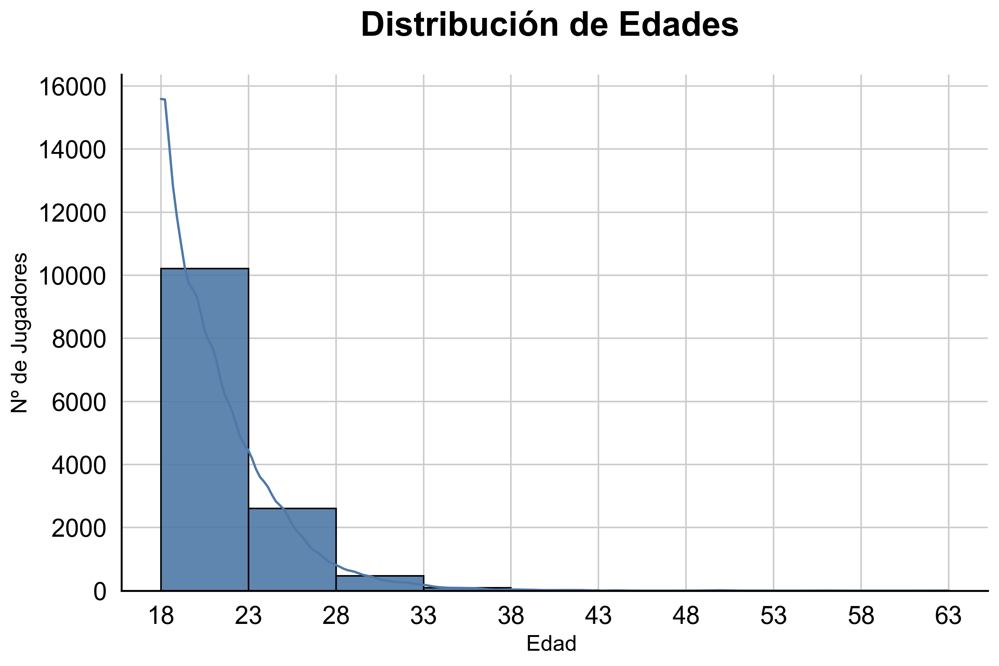

In [72]:
fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.histplot(data=df,x="Age",
    binwidth=5,
    kde=True,       
    color="#4e79a7", 
    alpha=0.9,
    edgecolor="black", 
    ax=ax
)
plt.title('Distribución de Edades ', fontsize=22, pad=25, color='black', fontweight='bold')
plt.xlabel('Edad ', fontsize=14, color='black')
plt.ylabel('Nº de Jugadores', fontsize=14, color='black')

plt.xticks(np.arange(min(df["Age"]), max(df["Age"])+5, 5), color='black')

ax.tick_params(axis='both', colors='black', labelsize=16)


sns.despine()
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')


plt.savefig('histograma_edades_agrupadogrande.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

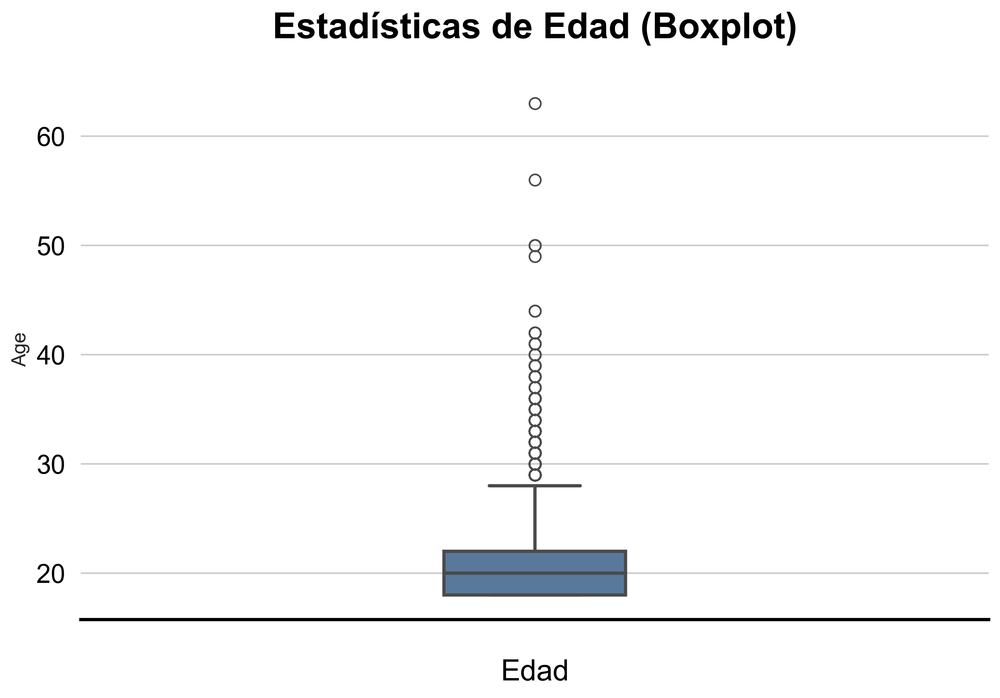

In [73]:
fig, ax = plt.subplots(figsize=(10, 6)) 
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)

sns.boxplot(
    y=df["Age"], 
    color="#4e79a7", 
    width=0.2,
    linewidth=2,     
    fliersize=7,     
    ax=ax)

plt.title('Estadísticas de Edad (Boxplot)', fontsize=22, pad=25, color='black', fontweight='bold')
plt.xlabel('Edad', fontsize=18, color='black', labelpad=15)


ax.tick_params(axis='y', colors='black', labelsize=16)


sns.despine(left=True) 
ax.spines['bottom'].set_color('black')
ax.spines['bottom'].set_linewidth(2)

# 6. GUARDAR
plt.savefig('boxplot_edad_canva_xl.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

Género

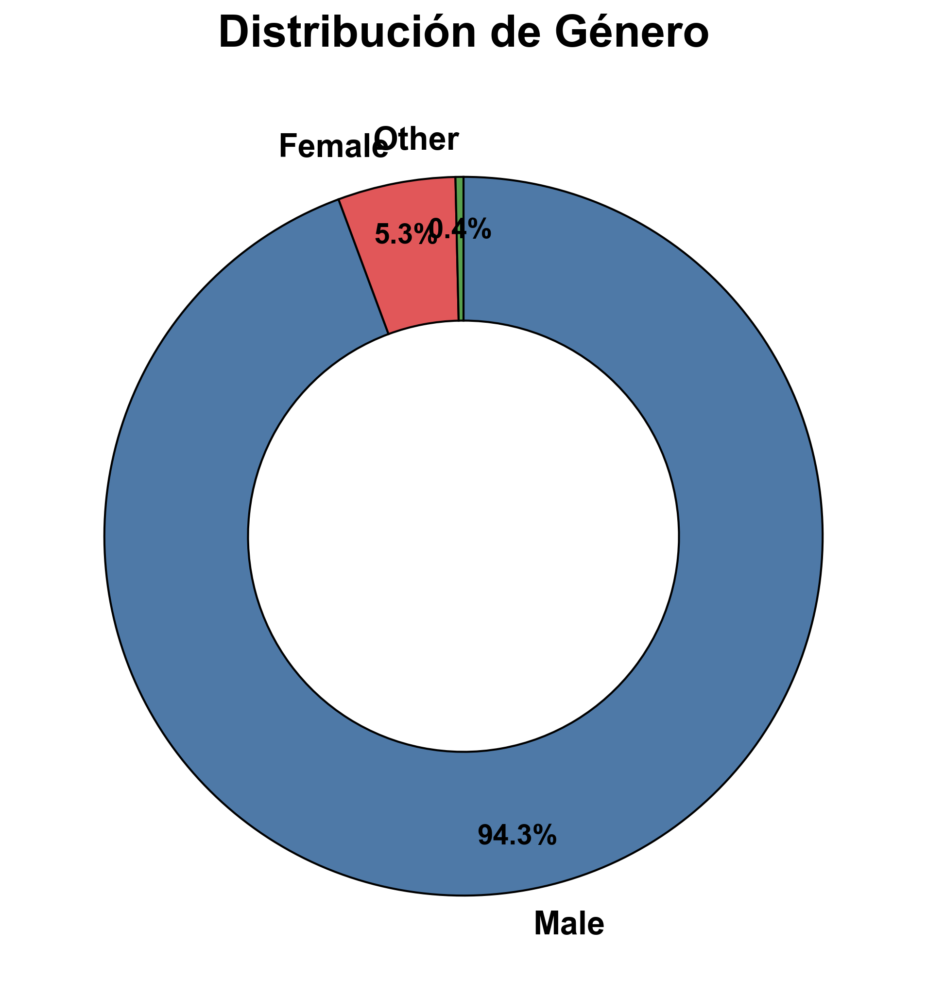

In [74]:



counts = df['Gender'].value_counts()
labels = counts.index
values = counts.values


fig, ax = plt.subplots(figsize=(8, 8)) 
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


colores = ['#4e79a7', '#e15759', '#59a14f']

wedges, texts, autotexts = ax.pie(
    values, 
    labels=labels, 
    autopct='%1.1f%%', 
    startangle=90, 
    counterclock=False,
    colors=colores,
    pctdistance=0.85,
    wedgeprops={'width': 0.4, 'edgecolor':'black', 'linewidth': 1},
    textprops={'color':"black", 'fontsize': 16, 'fontweight': 'bold'}
)


centre_circle = plt.Circle((0,0), 0.70, fc='white', alpha=0) 
fig.gca().add_artist(centre_circle)


for autotext in autotexts:
    autotext.set_color('black')
    autotext.set_fontsize(14)

plt.title('Distribución de Género', fontsize=22, pad=20, color='black', fontweight='bold')


plt.savefig('donut_genero_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

Pais

In [75]:
dfpaises=df["Birthplace"].value_counts().reset_index()
dfpaises.columns = ['Birthplace', 'count']

total_muestras = dfpaises['count'].sum()
dfpaises['percentage'] = (dfpaises['count'] / total_muestras) * 100

top_10 = dfpaises.nlargest(10, 'count')

fig=px.treemap(top_10,
               path=["Birthplace"],
               values="count",
               custom_data=['percentage'],
               title="Distribución de paises de los usuarios(top 10)")

fig.update_layout(
    paper_bgcolor='rgba(0,0,0,0)', 
    plot_bgcolor='rgba(0,0,0,0)', 
    font=dict(
        size=20,          
        color="black",    
        family="Arial"
    ),
    margin=dict(t=50, l=10, r=10, b=10) 
)

fig.update_traces(
    texttemplate="<b>%{label}</b><br>%{customdata[0]:.2f}%",
    hovertemplate="<b>%{label}</b><br>Cantidad: %{value}<br>Porcentaje: %{customdata[0]:.2f}%"
)

fig.show()

Estudios

In [76]:
Estudios=df["Degree"].value_counts()

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\373290988.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




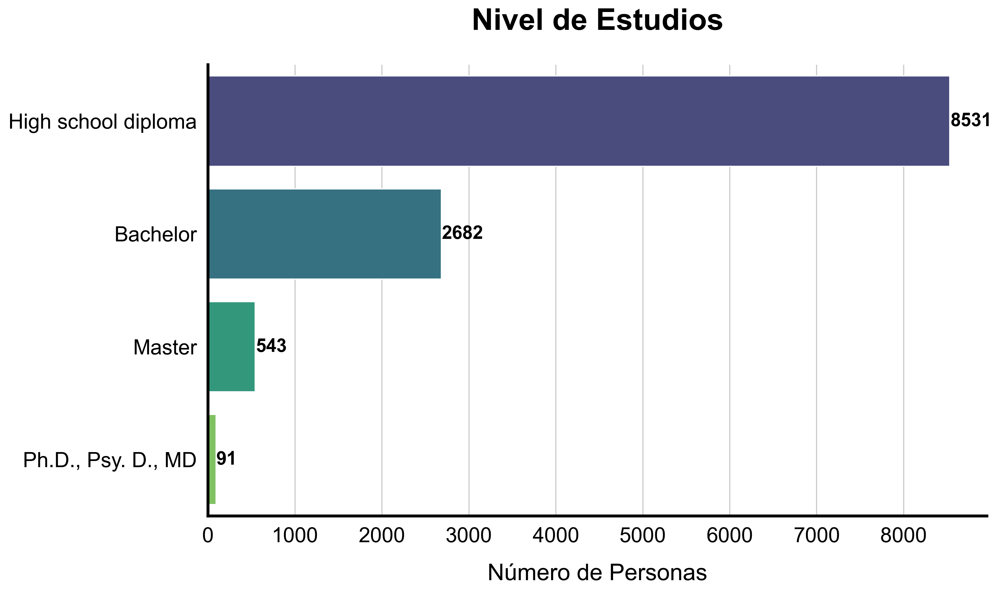

In [77]:
fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.barplot(
    y=Estudios.index, 
    x=Estudios.values, 
    palette='viridis', 
    ax=ax
)




plt.title('Nivel de Estudios', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Número de Personas', fontsize=20, color='black', labelpad=15)
plt.ylabel('', color='black') 


ax.tick_params(axis='both', colors='black', labelsize=18)


for i, v in enumerate(Estudios.values):
    ax.text(v + 5, i, str(int(v)), color='black', va='center', fontsize=16, fontweight='bold')


sns.despine()
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


plt.savefig('distribucion_estudios_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

Estado laboral


In [78]:
Trabajo=df["Work"].value_counts().drop("Sin contestar")

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\1821894201.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




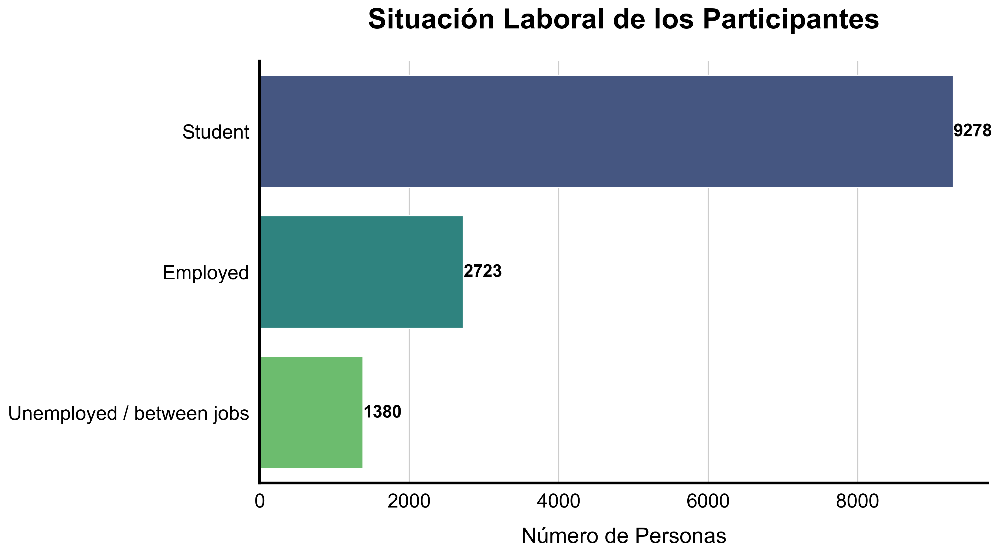

In [79]:
fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.barplot(
    y=Trabajo.index, 
    x=Trabajo.values, 
    palette='viridis', 
    ax=ax
)




plt.title('Situación Laboral de los Participantes', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Número de Personas', fontsize=20, color='black', labelpad=15)
plt.ylabel('', color='black')


ax.tick_params(axis='both', colors='black', labelsize=18)


for i, v in enumerate(Trabajo.values):
    ax.text(v + 5, i, str(int(v)), color='black', va='center', fontsize=16, fontweight='bold')


sns.despine()
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


plt.savefig('situacion_laboral_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

estudios vs trabajo


poner porcentajes en este grafico


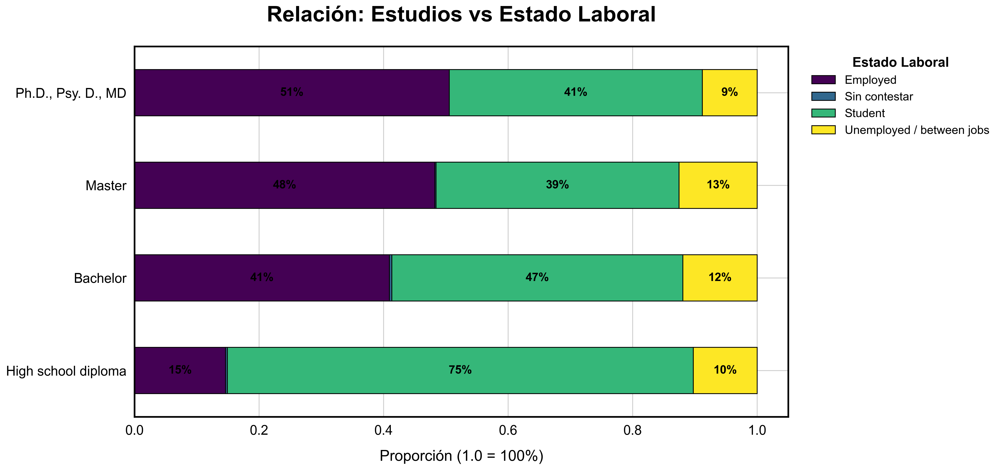

In [80]:

tabla_estudios_empleo = pd.crosstab(df['Degree'], df['Work'])
tabla_porcentajes = tabla_estudios_empleo.div(tabla_estudios_empleo.sum(1), axis=0)


fig, ax = plt.subplots(figsize=(14, 8)) 
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


tabla_porcentajes.plot(kind='barh', stacked=True, colormap='viridis', ax=ax, edgecolor='black', linewidth=1)




plt.title('Relación: Estudios vs Estado Laboral', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Proporción (1.0 = 100%)', fontsize=18, color='black', labelpad=15)
plt.ylabel('', color='black') 


ax.tick_params(axis='both', colors='black', labelsize=16)


for n, x in enumerate([*tabla_porcentajes.index.values]):
    for (proportion, y_loc) in zip(tabla_porcentajes.loc[x],
                                   tabla_porcentajes.loc[x].cumsum()):
        if proportion > 0.05: 
            plt.text(y_loc - proportion / 2, n, 
                     f'{proportion:.0%}', 
                     va='center', ha='center', 
                     color='black', fontsize=14, fontweight='bold')


legend = plt.legend(title='Estado Laboral', bbox_to_anchor=(1.02, 1), 
                    loc='upper left', frameon=False, fontsize=14)
plt.setp(legend.get_title(), color='black', fontsize=16, fontweight='bold')
for text in legend.get_texts():
    plt.setp(text, color='black')


for spine in ax.spines.values():
    spine.set_color('black')
    spine.set_linewidth(2)


plt.savefig('estudios_vs_trabajo_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

Juegos

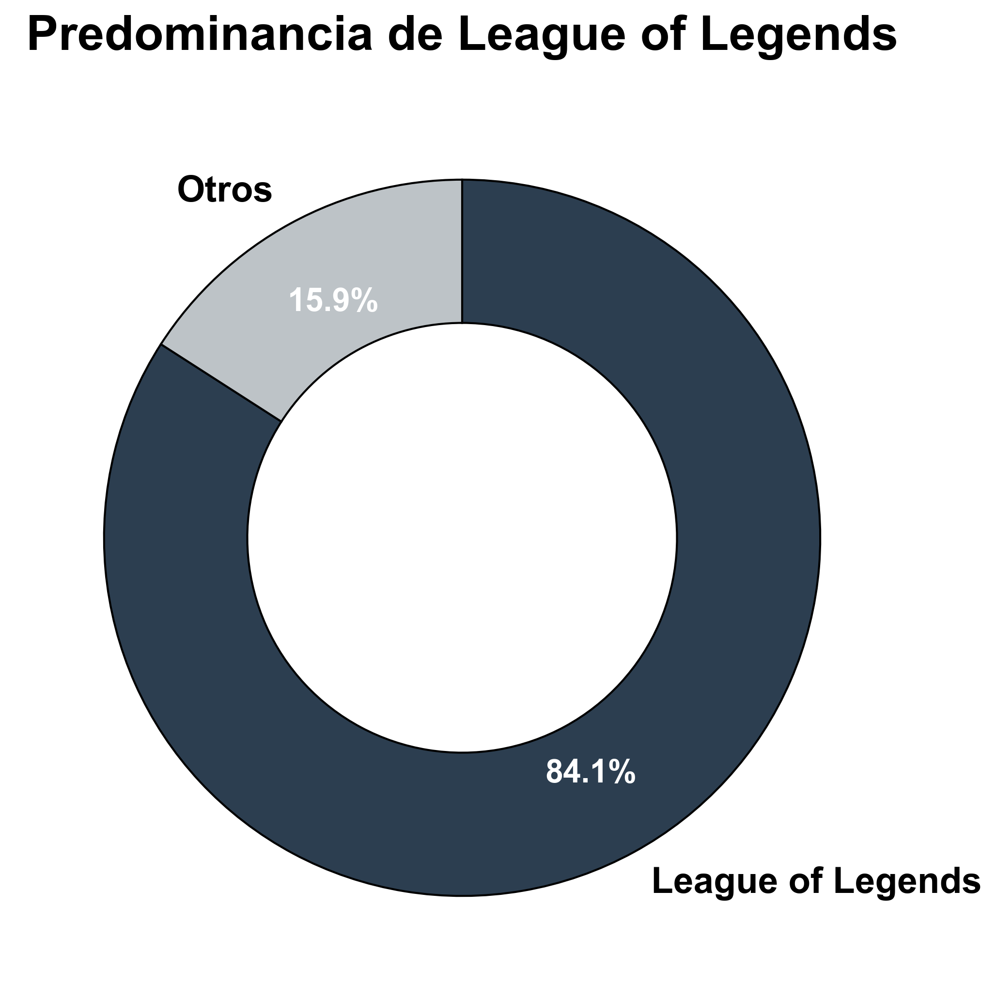

In [81]:

df["Game_grouped"] = df["Game"].where(df["Game"] == "League of Legends", "Otros")
counts = df["Game_grouped"].value_counts()
labels = counts.index
values = counts.values


fig, ax = plt.subplots(figsize=(8, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


colores = ['#2c3e50', '#bdc3c7'] 


wedges, texts, autotexts = ax.pie(
    values, 
    labels=labels, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colores,
    counterclock=False,
    pctdistance=0.75,    
    labeldistance=1.1,   
    textprops={'color':"black", 'fontsize': 18, 'fontweight': 'bold'},
    wedgeprops={'width': 0.4, 'edgecolor':'black', 'linewidth': 1}
)





for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontsize(16)
    autotext.set_fontweight('bold')


plt.title('Predominancia de League of Legends', fontsize=24, pad=20, color='black', fontweight='bold')

# 8. GUARDAR
plt.savefig('donut_lol_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

Horas totales

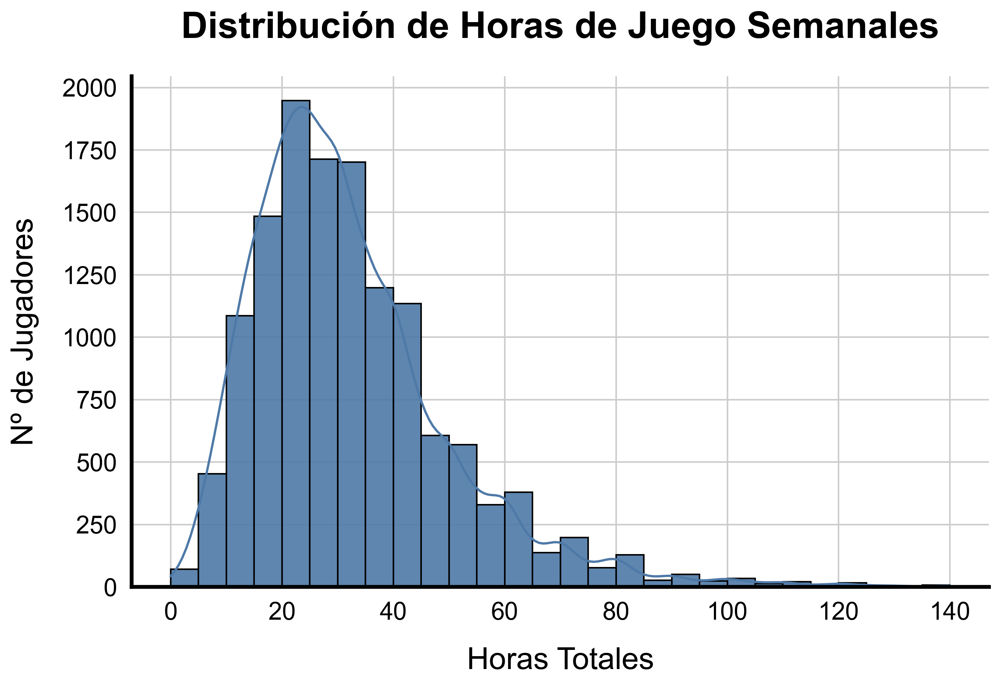

In [82]:

fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.histplot(
    data=df,
    x="Horas_totales",
    kde=True,
    binwidth=5,
    color="#4e79a7", 
    alpha=0.9,
    edgecolor="black",
    linewidth=1,
    ax=ax
)


plt.title('Distribución de Horas de Juego Semanales', fontsize=24, pad=25, color='black', fontweight='bold')
plt.xlabel('Horas Totales', fontsize=20, color='black', labelpad=15)
plt.ylabel('Nº de Jugadores', fontsize=20, color='black', labelpad=15)


ax.tick_params(axis='both', colors='black', labelsize=16)


sns.despine()
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


plt.savefig('histograma_horas_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

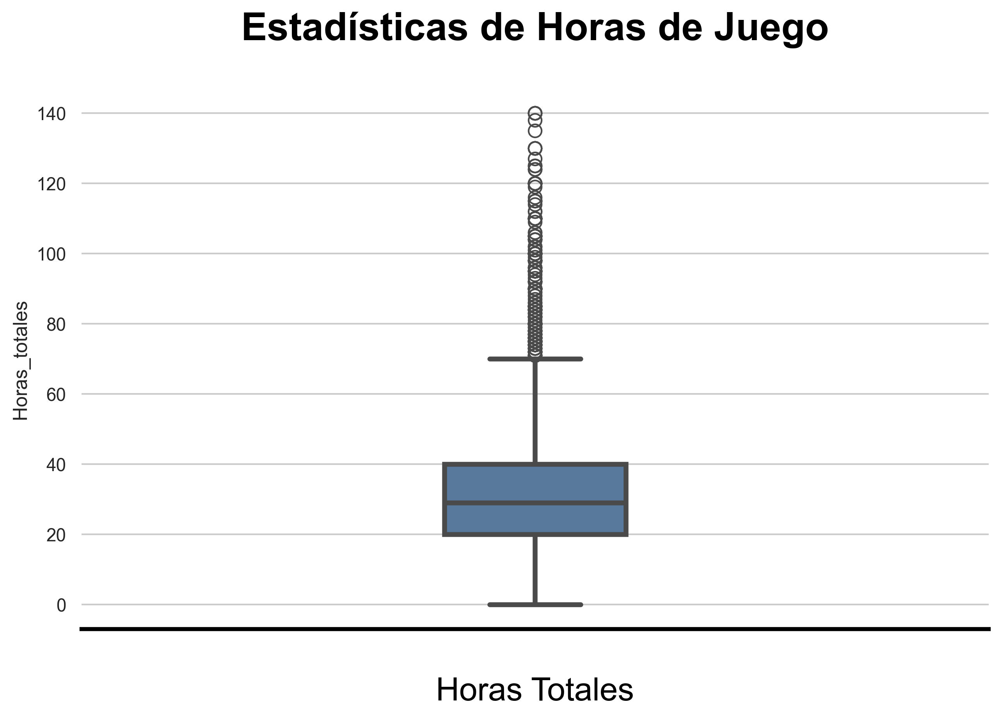

In [83]:

fig, ax = plt.subplots(figsize=(10, 6)) 
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.boxplot(
    y=df["Horas_totales"], 
    color="#4e79a7", 
    width=0.2,        
    linewidth=3,    
    fliersize=8,      
    ax=ax
)


plt.title('Estadísticas de Horas de Juego', fontsize=24, pad=30, color='black', fontweight='bold')
plt.xlabel('Horas Totales', fontsize=20, color='black', labelpad=20)


ax.tick_params(axis='x', colors='black', labelsize=18)


sns.despine(left=True)
ax.spines['bottom'].set_color('black')
ax.spines['bottom'].set_linewidth(2.5)

plt.savefig('boxplot_horas_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

Estado mental de la muestra

In [84]:
df_mujeres = df[df['Gender'] == 'Female'].copy()
df_hombres = df[df['Gender'] == 'Male'].copy()

Ansiedad


In [85]:
df["Nivel_Ansiedad"].value_counts()

Nivel_Ansiedad
Mínima      7430
Leve        3655
Moderada    1603
Severa       731
Name: count, dtype: int64

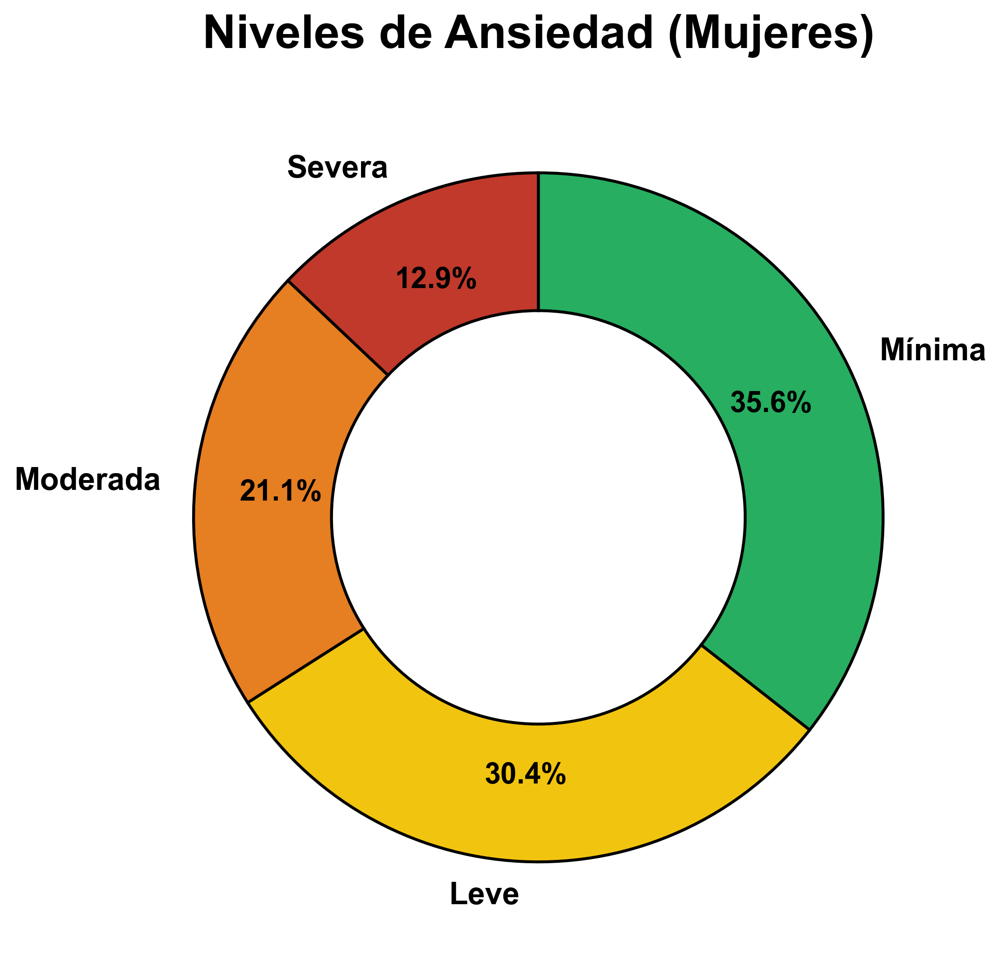

In [86]:

orden_ansiedad = ['Mínima', 'Leve', 'Moderada', 'Severa']
counts = df_mujeres["Nivel_Ansiedad"].value_counts().reindex(orden_ansiedad).fillna(0)
labels = counts.index
values = counts.values


fig, ax = plt.subplots(figsize=(8, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


colores = ['#27ae60', '#f1c40f', '#e67e22', '#c0392b'] 


wedges, texts, autotexts = ax.pie(
    values, 
    labels=labels, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colores,
    counterclock=False,
    pctdistance=0.75,
    labeldistance=1.1,
    textprops={'color':"black", 'fontsize': 16, 'fontweight': 'bold'},
    wedgeprops={'width': 0.4, 'edgecolor':'black', 'linewidth': 1.5}
)


for i, autotext in enumerate(autotexts): 
  autotext.set_color('black')
  autotext.set_fontsize(15)
  autotext.set_fontweight('bold')

plt.title('Niveles de Ansiedad (Mujeres)', fontsize=24, pad=20, color='black', fontweight='bold')


plt.savefig('ansiedad_mujeres_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

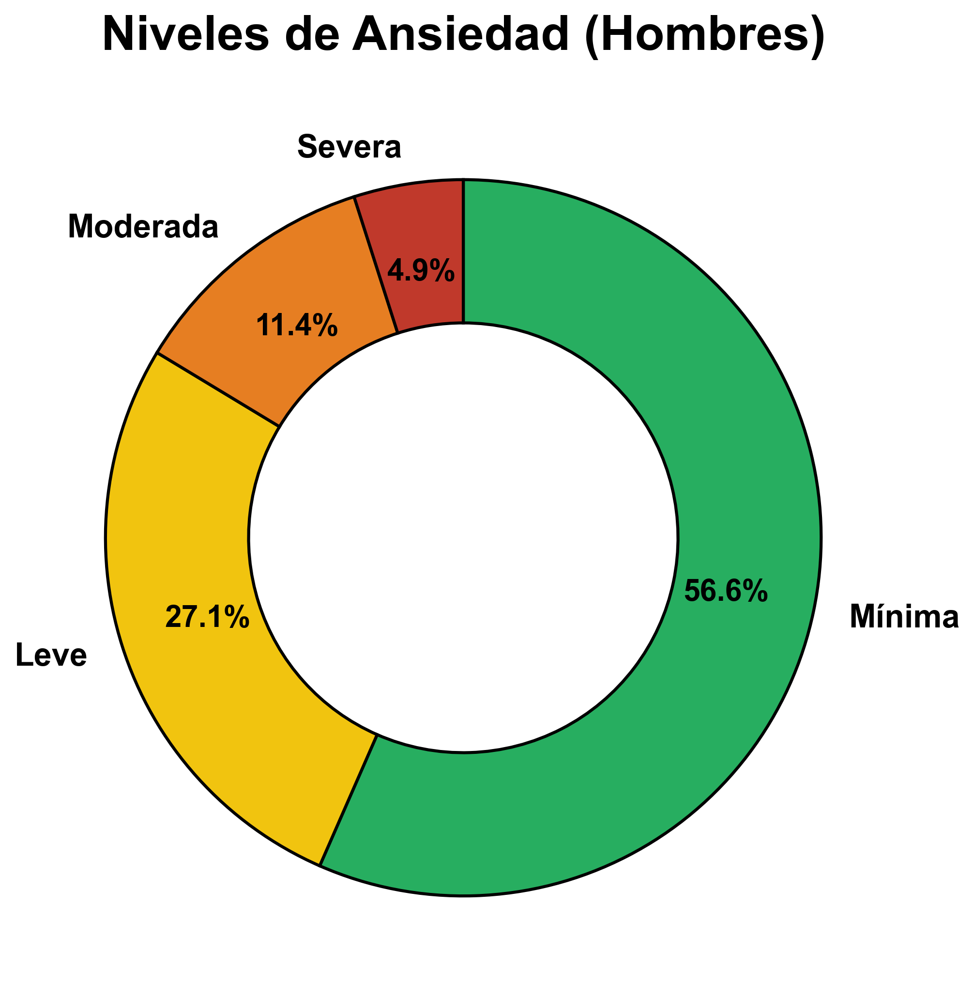

In [87]:

counts = df_hombres["Nivel_Ansiedad"].value_counts().reindex(orden_ansiedad).fillna(0)
values = counts.values

fig, ax = plt.subplots(figsize=(8, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)

wedges, texts, autotexts = ax.pie(
    values, labels=labels, autopct='%1.1f%%', startangle=90, colors=colores,
    counterclock=False, pctdistance=0.75, labeldistance=1.1,
    textprops={'color':"black", 'fontsize': 16, 'fontweight': 'bold'},
    wedgeprops={'width': 0.4, 'edgecolor':'black', 'linewidth': 1.5}
)

for i, autotext in enumerate(autotexts):
 autotext.set_color('black')
 autotext.set_fontsize(15)
 autotext.set_fontweight('bold')

plt.title('Niveles de Ansiedad (Hombres)', fontsize=24, pad=20, color='black', fontweight='bold')

plt.savefig('ansiedad_hombres_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

In [88]:
df_filtrado = df[df["Gender"].isin(["Male", "Female"])]

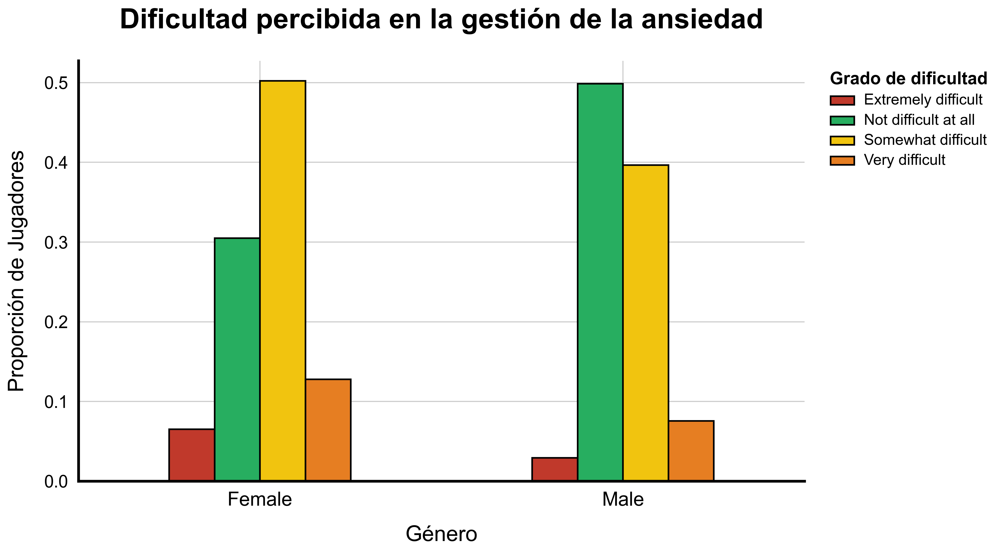

In [89]:

orden_gade = sorted(df_filtrado['GADE'].dropna().unique().astype(str))

tabla_gade_sexo = pd.crosstab(df_filtrado['Gender'], df_filtrado['GADE'], normalize='index')
tabla_gade_sexo = tabla_gade_sexo[orden_gade]


fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)

colores_semaforo = ['#c0392b', '#27ae60', '#f1c40f', '#e67e22']


tabla_gade_sexo.plot(
    kind='bar', 
    ax=ax, 
    color=colores_semaforo[:len(orden_gade)],
    edgecolor='black', 
    linewidth=1.5
)


plt.title('Dificultad percibida en la gestión de la ansiedad', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Género', fontsize=20, color='black', labelpad=15)
plt.ylabel('Proporción de Jugadores', fontsize=20, color='black', labelpad=15)


plt.xticks(rotation=0, color='black', fontsize=18)
ax.tick_params(axis='y', colors='black', labelsize=16)


legend = plt.legend(title='Grado de dificultad', bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False)
plt.setp(legend.get_title(), color='black', fontsize=16, fontweight='bold')
for text in legend.get_texts():
    plt.setp(text, color='black', fontsize=14)

sns.despine()
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


plt.savefig('gade_genero_semaforo_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

Satisfación con la vida

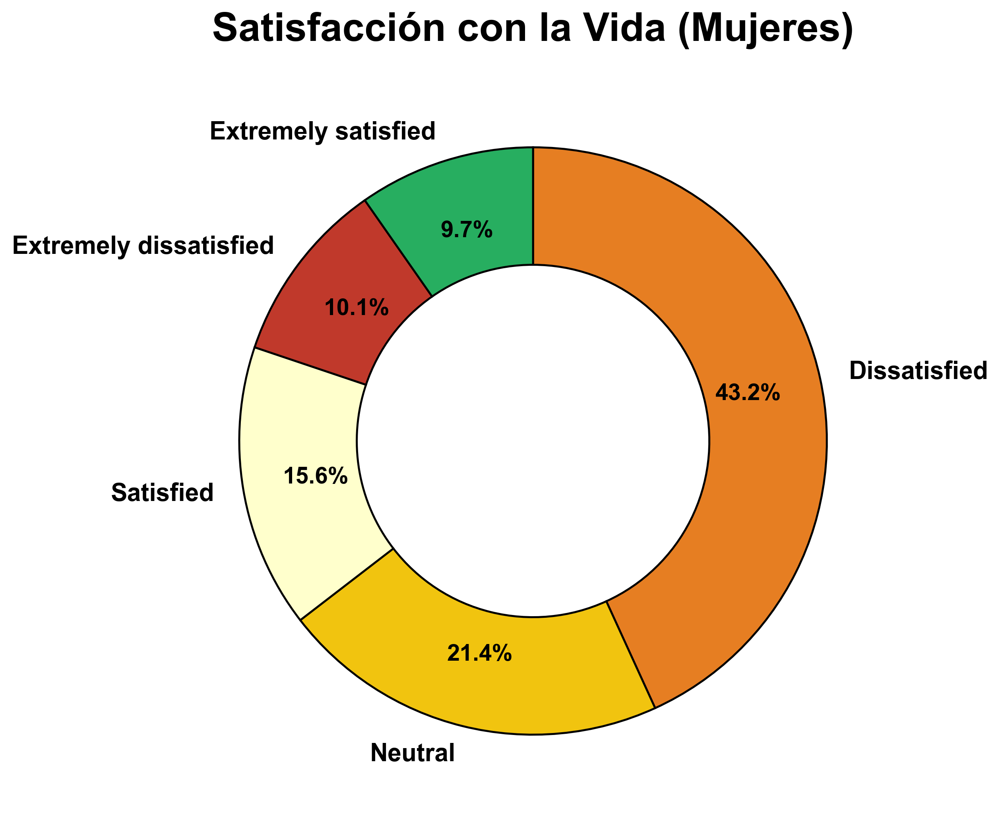

In [90]:

mapa_colores = {
    'Extremely satisfied': '#27ae60',    
    'Satisfied': '#ffffcc',              
    'Neutral': '#f1c40f',                
    'Dissatisfied': '#e67e22',           
    'Extremely dissatisfied': '#c0392b'  
}


counts = df_mujeres["Nivel_Satisfacción"].value_counts()
labels = counts.index
values = counts.values


colors = [mapa_colores.get(label, '#808080') for label in labels]


fig, ax = plt.subplots(figsize=(8, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


wedges, texts, autotexts = ax.pie(
    values, 
    labels=labels, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colors,
    counterclock=False,
    pctdistance=0.75,
    labeldistance=1.1,
    textprops={'color':"black", 'fontsize': 15, 'fontweight': 'bold'},
    wedgeprops={'width': 0.4, 'edgecolor':'black', 'linewidth': 1.2}
)


for autotext in autotexts:
    autotext.set_color('black')
    autotext.set_fontsize(14)
    autotext.set_fontweight('bold')

plt.title('Satisfacción con la Vida (Mujeres)', fontsize=24, pad=20, color='black', fontweight='bold')


plt.savefig('swl_women_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

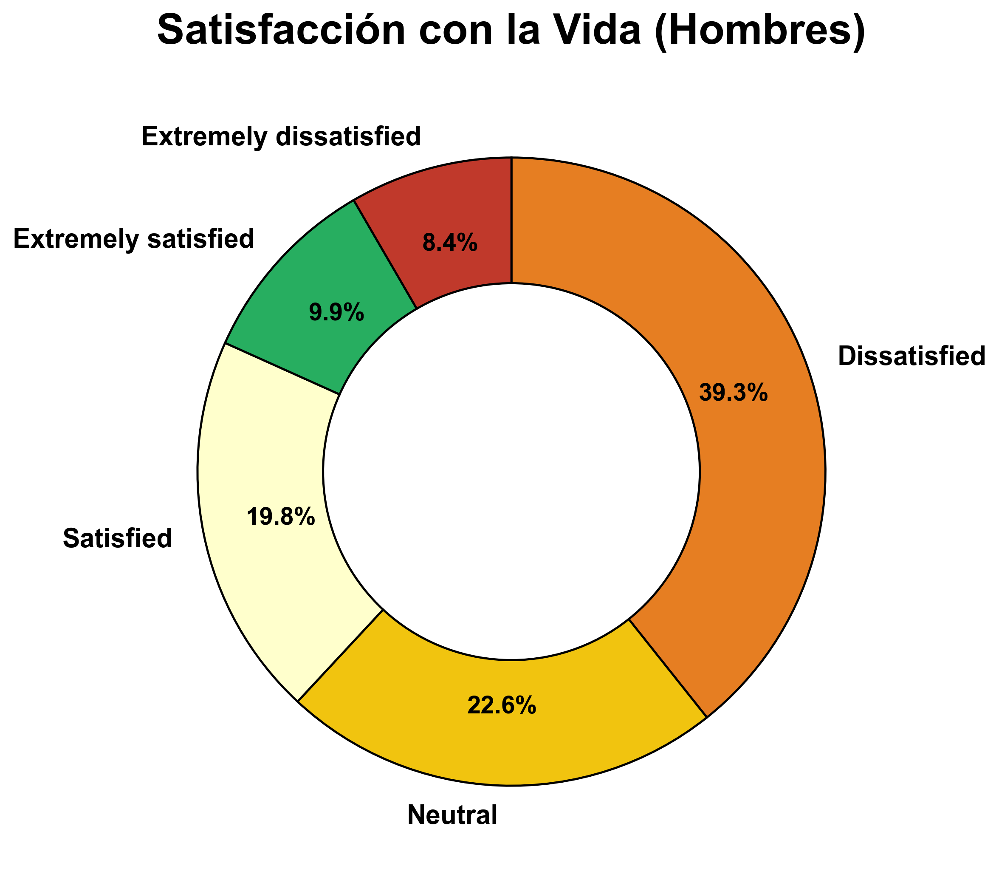

In [91]:

mapa_colores = {
    'Extremely satisfied': '#27ae60',    
    'Satisfied': '#ffffcc',              
    'Neutral': '#f1c40f',                
    'Dissatisfied': '#e67e22',           
    'Extremely dissatisfied': '#c0392b' 
}


counts = df_hombres["Nivel_Satisfacción"].value_counts()
labels = counts.index
values = counts.values


colors = [mapa_colores.get(label, '#808080') for label in labels]


fig, ax = plt.subplots(figsize=(8, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


wedges, texts, autotexts = ax.pie(
    values, 
    labels=labels, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colors,
    counterclock=False,
    pctdistance=0.75,
    labeldistance=1.1,
    textprops={'color':"black", 'fontsize': 15, 'fontweight': 'bold'},
    wedgeprops={'width': 0.4, 'edgecolor':'black', 'linewidth': 1.2}
)


for autotext in autotexts:
    autotext.set_color('black')
    autotext.set_fontsize(14)
    autotext.set_fontweight('bold')

plt.title('Satisfacción con la Vida (Hombres)', fontsize=24, pad=20, color='black', fontweight='bold')


plt.savefig('swl_men_canva_final.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

Fobia Social

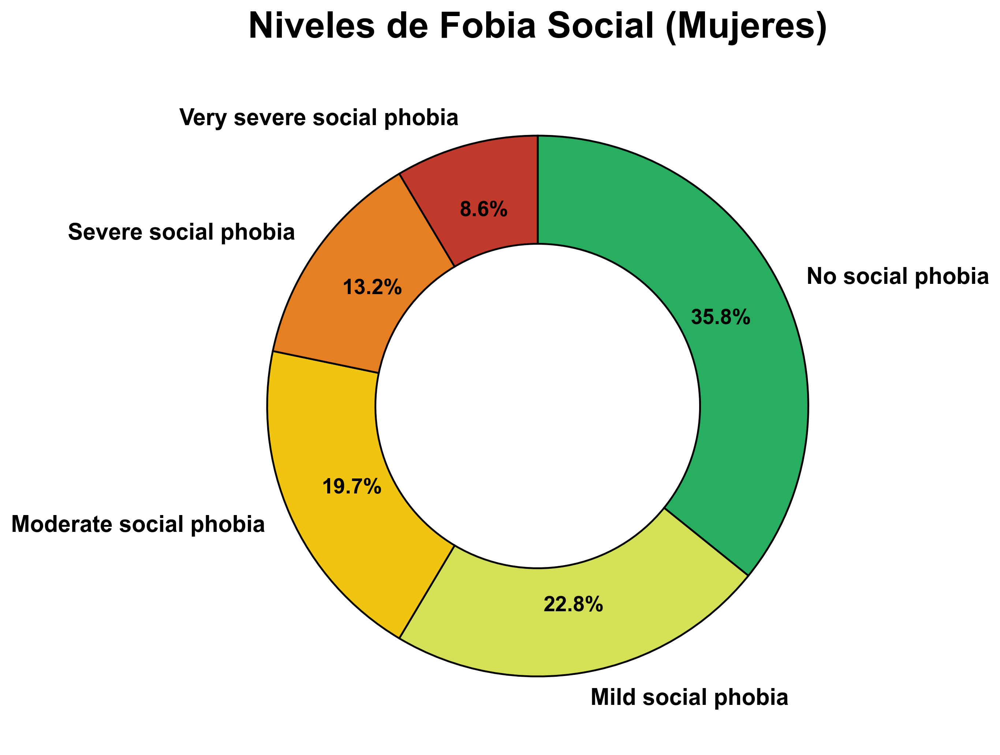

In [92]:

mapa_colores_fobia = {
    'No social phobia': '#27ae60',           
    'Mild social phobia': '#d4e157',         
    'Moderate social phobia': '#f1c40f',     
    'Severe social phobia': '#e67e22',       
    'Very severe social phobia': '#c0392b' }


counts = df_mujeres["Nivel_Fobia_social"].value_counts().drop("Sin contestar", errors='ignore')
labels = counts.index
values = counts.values


colors = [mapa_colores_fobia.get(label, '#808080') for label in labels]


fig, ax = plt.subplots(figsize=(8, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


wedges, texts, autotexts = ax.pie(
    values, 
    labels=labels, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colors,
    counterclock=False,
    pctdistance=0.75,
    labeldistance=1.1,
    textprops={'color':"black", 'fontsize': 15, 'fontweight': 'bold'},
    wedgeprops={'width': 0.4, 'edgecolor':'black', 'linewidth': 1.2} 
)


for autotext in autotexts:
    autotext.set_color('black')
    autotext.set_fontsize(14)
    autotext.set_fontweight('bold')

plt.title('Niveles de Fobia Social (Mujeres)', fontsize=24, pad=20, color='black', fontweight='bold')


plt.savefig('fobia_social_women_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

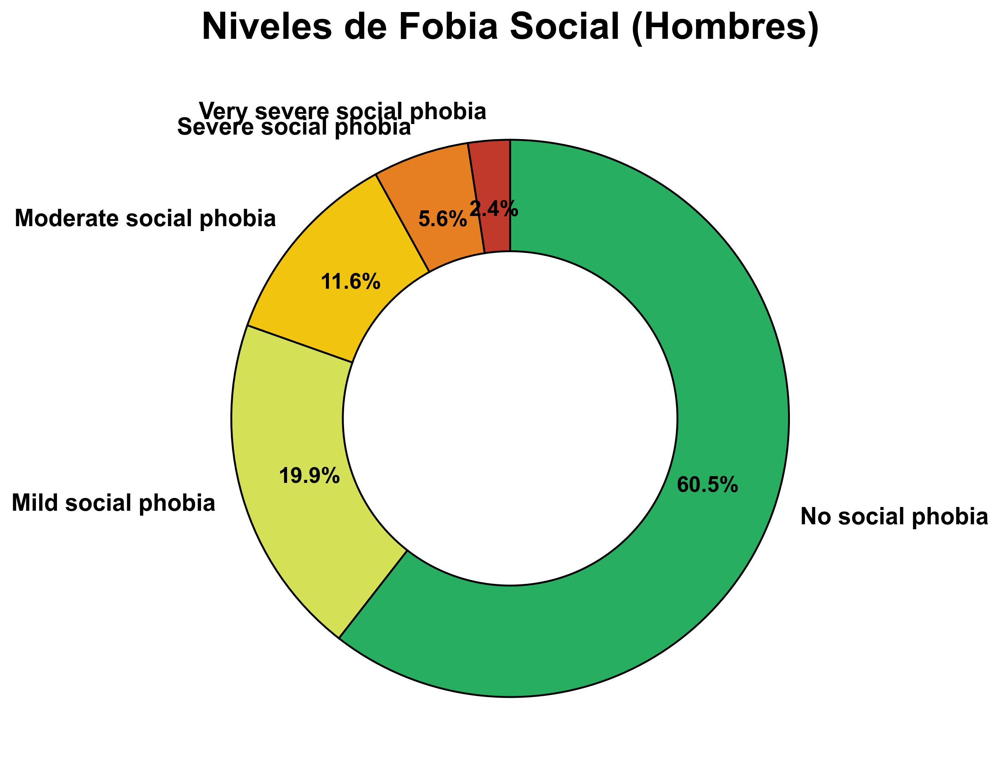

In [93]:

counts = df_hombres["Nivel_Fobia_social"].value_counts().drop("Sin contestar", errors='ignore')
labels = counts.index
values = counts.values


colors = [mapa_colores_fobia.get(label, '#808080') for label in labels]


fig, ax = plt.subplots(figsize=(8, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)

wedges, texts, autotexts = ax.pie(
    values, 
    labels=labels, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colors,
    counterclock=False,
    pctdistance=0.75,
    labeldistance=1.1,
    textprops={'color':"black", 'fontsize': 15, 'fontweight': 'bold'},
    wedgeprops={'width': 0.4, 'edgecolor':'black', 'linewidth': 1.2}
)


for autotext in autotexts:
    autotext.set_color('black')
    autotext.set_fontsize(14)
    autotext.set_fontweight('bold')

plt.title('Niveles de Fobia Social (Hombres)', fontsize=24, pad=20, color='black', fontweight='bold')


plt.savefig('fobia_social_men_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

Heatmap

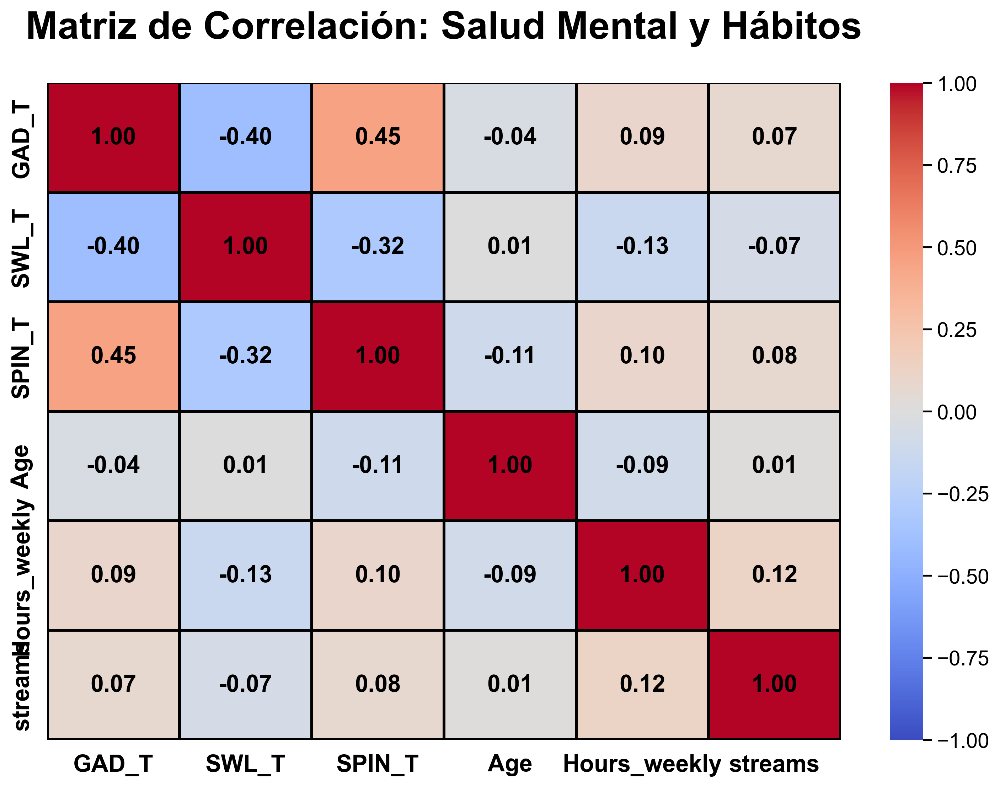

In [94]:

columnas_heatmap = ["GAD_T", "SWL_T", "SPIN_T", "Age", "Hours_weekly", "streams"]
matriz_corr = df[columnas_heatmap].corr()


fig, ax = plt.subplots(figsize=(12, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.heatmap(
    matriz_corr,
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
    vmin=-1, 
    vmax=1,
    center=0,
    linewidths=1.5,      
    linecolor='black',    
  
    annot_kws={"size": 16, "weight": "bold", "color": "black"}, 
    ax=ax
)




plt.title("Matriz de Correlación: Salud Mental y Hábitos", fontsize=26, pad=30, color='black', fontweight='bold')


ax.tick_params(axis='both', which='major', labelsize=16, labelcolor='black')
plt.xticks(fontweight='bold')
plt.yticks(fontweight='bold')


cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=14, colors='black')


plt.savefig('heatmap_salud_mental_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

fobia vs playstyle


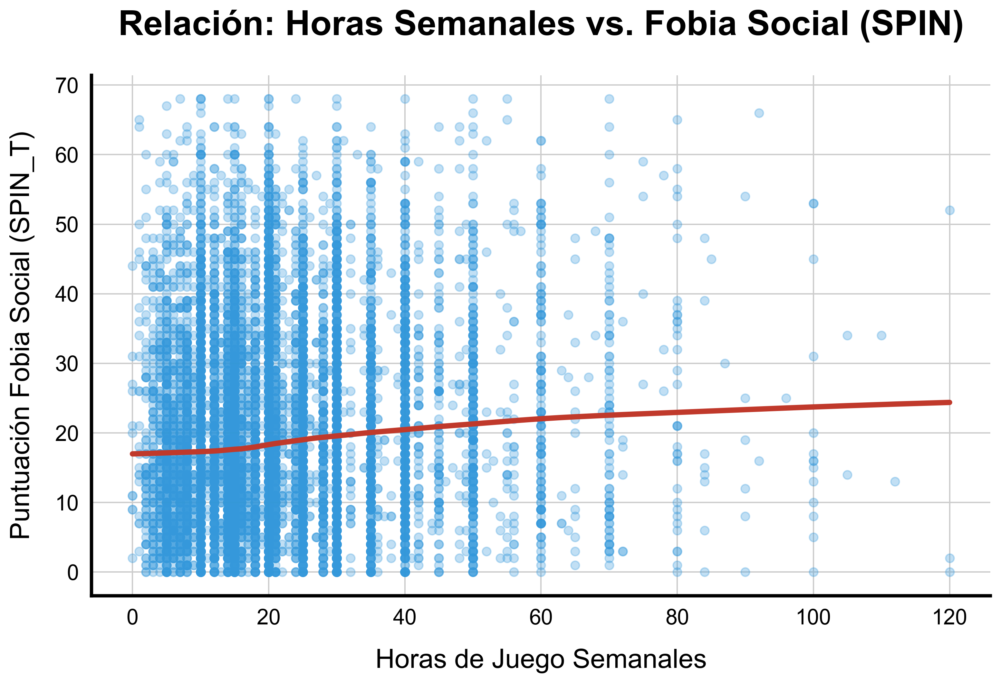

In [95]:


fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.regplot(
    data=df, 
    x="Hours_weekly", 
    y="SPIN_T", 
    lowess=True, 
    scatter_kws={'alpha':0.3, 'color':'#3498db', 's': 40}, 
    line_kws={'color':'#c0392b', 'linewidth':4},        
    ax=ax
)




plt.title('Relación: Horas Semanales vs. Fobia Social (SPIN)', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Horas de Juego Semanales', fontsize=20, color='black', labelpad=15)
plt.ylabel('Puntuación Fobia Social (SPIN_T)', fontsize=20, color='black', labelpad=15)


ax.tick_params(axis='both', colors='black', labelsize=16)


sns.despine()
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


plt.savefig('relacion_horas_fobia_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

In [96]:
df["Playstyle"].value_counts()

Playstyle
Multiplayer - online - with real life friends                        5552
Multiplayer - online - with strangers                                4123
Multiplayer - online - with online acquaintances or teammates        2643
Singleplayer                                                          756
Multiplayer - offline (people in the same room)                        47
                                                                     ... 
Multiplayer - online - with strangers or real life friends              1
Multiplayer - online with online team mates and real life friends       1
Mutliplayer - A mix of friends/strangers.                               1
Multiplayer - online - with real life friends and strangers             1
Porn                                                                    1
Name: count, Length: 292, dtype: int64

In [97]:

top_5_playstyles = df['Playstyle'].value_counts().nlargest(5).index

df['Playstyle_Clean'] = df['Playstyle'].where(df['Playstyle'].isin(top_5_playstyles))


print(df['Playstyle_Clean'].value_counts())

Playstyle_Clean
Multiplayer - online - with real life friends                    5552
Multiplayer - online - with strangers                            4123
Multiplayer - online - with online acquaintances or teammates    2643
Singleplayer                                                      756
Multiplayer - offline (people in the same room)                    47
Name: count, dtype: int64


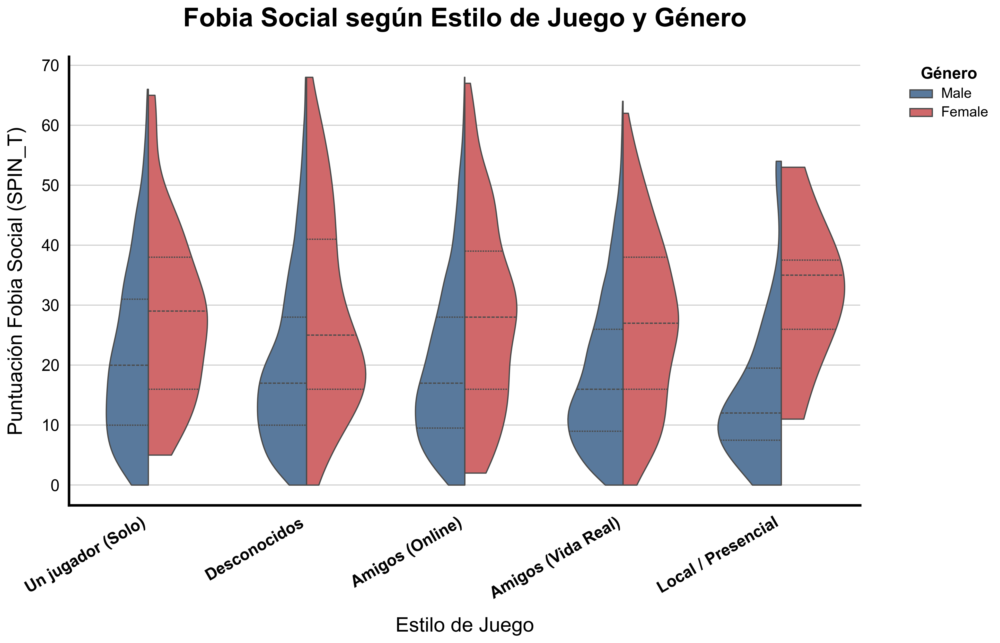

In [98]:

df_filtrado = df[df["Gender"].isin(["Male", "Female"])]

fig, ax = plt.subplots(figsize=(14, 8)) 
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)

sns.violinplot(
    data=df_filtrado, 
    x="Playstyle_Short", 
    y="SPIN_T", 
    hue="Gender", 
    split=True, 
    inner="quart", 
    palette={"Male": "#4e79a7", "Female": "#e15759"}, 
    cut=0,
    ax=ax
)




plt.title('Fobia Social según Estilo de Juego y Género', fontsize=26, pad=30, color='black', fontweight='bold')


plt.xlabel('Estilo de Juego', fontsize=20, color='black', labelpad=15)
plt.ylabel('Puntuación Fobia Social (SPIN_T)', fontsize=20, color='black', labelpad=15)


plt.xticks(rotation=30, ha='right', fontsize=16, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')


legend = plt.legend(title='Género', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
plt.setp(legend.get_title(), color='black', fontsize=16, fontweight='bold')
for text in legend.get_texts():
    plt.setp(text, color='black', fontsize=14)


sns.despine()
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


plt.savefig('fobia_estilo_genero_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

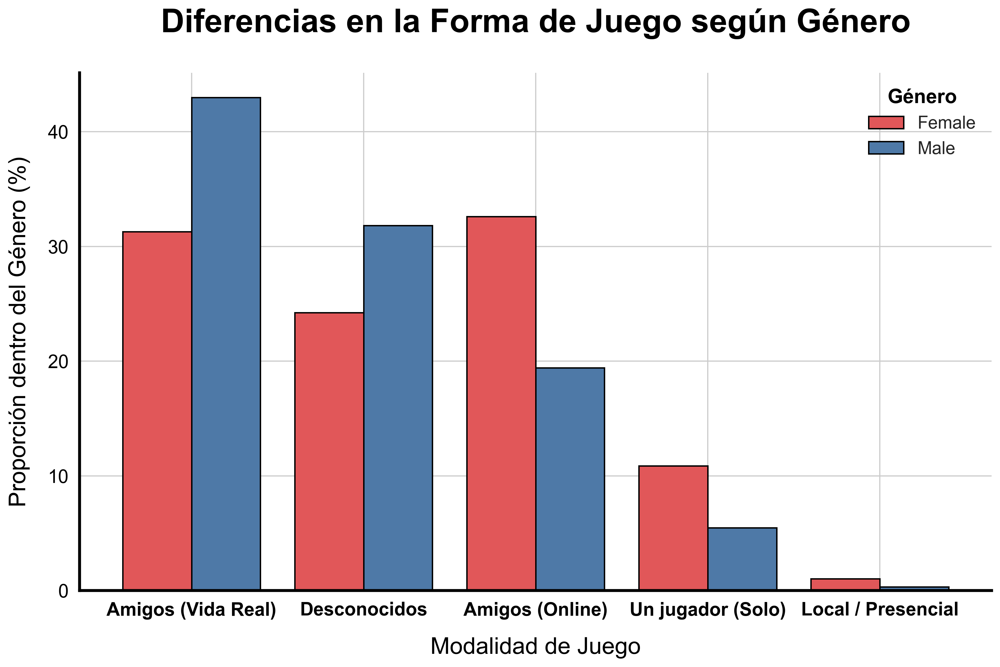

In [99]:



df_f = df[df["Gender"].isin(["Male", "Female"])].copy()
df_f['Playstyle_Short'] = df_f['Playstyle_Clean'].replace(mapeo_playstyle)

tabla_comparativa = pd.crosstab(df_f['Playstyle_Short'], df_f['Gender'], normalize='columns') * 100

fig, ax = plt.subplots(figsize=(14, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)

tabla_comparativa.mean(axis=1).sort_values(ascending=False)
tabla_comparativa = tabla_comparativa.reindex(tabla_comparativa.mean(axis=1).sort_values(ascending=False).index)

tabla_comparativa.plot(
    kind='bar', 
    ax=ax, 
    color=[  "#e15759","#4e79a7"], 
    edgecolor='black', 
    linewidth=1.2,
    width=0.8
)



plt.title('Diferencias en la Forma de Juego según Género', fontsize=28, pad=35, color='black', fontweight='bold')
plt.xlabel('Modalidad de Juego', fontsize=20, color='black', labelpad=15)
plt.ylabel('Proporción dentro del Género (%)', fontsize=20, color='black', labelpad=15)


plt.xticks(rotation=0, fontsize=16, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')


legend = plt.legend(title='Género', fontsize=15, title_fontsize=17, frameon=False, loc='upper right')
plt.setp(legend.get_title(), color='black', fontweight='bold')


sns.despine()
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)

# 5. GUARDAR PARA CANVA
plt.savefig('comparativa_playstyle_genero.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

nivel de fobia segun el motivo de juego

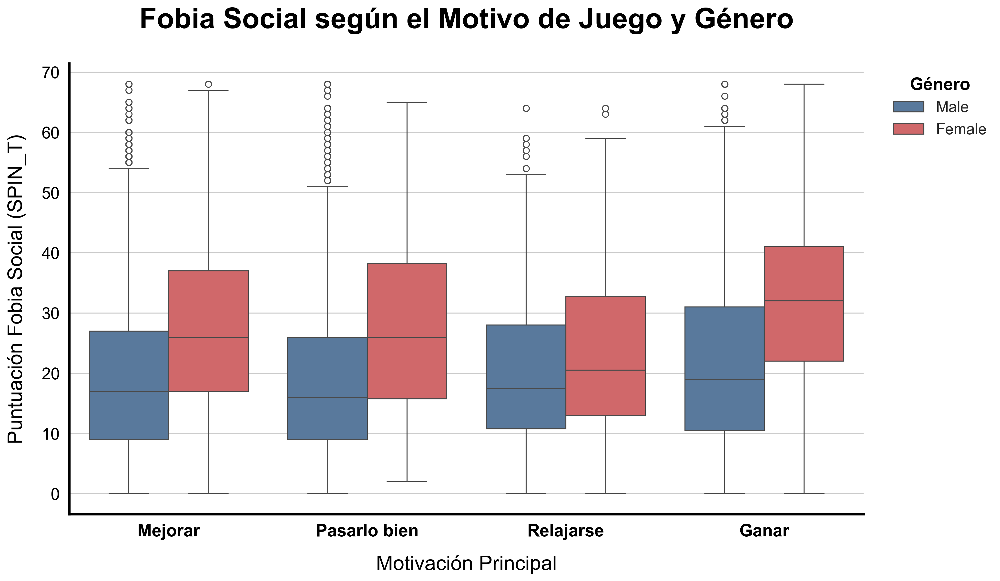

In [100]:

df_f = df[df["Gender"].isin(["Male", "Female"])].copy()


orden_motivacion = df_f.groupby('whyplay_Short')['SPIN_T'].median().sort_values().index


fig, ax = plt.subplots(figsize=(14, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.boxplot(
    data=df_f,
    x="whyplay_Short",
    y="SPIN_T",
    hue="Gender",
    order=orden_motivacion,
    palette={"Male": "#4e79a7", "Female": "#e15759"}, 
    ax=ax
)



plt.title('Fobia Social según el Motivo de Juego y Género', fontsize=28, pad=35, color='black', fontweight='bold')
plt.xlabel('Motivación Principal', fontsize=20, color='black', labelpad=15)
plt.ylabel('Puntuación Fobia Social (SPIN_T)', fontsize=20, color='black', labelpad=15)


plt.xticks(fontsize=17, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')


legend = plt.legend(title='Género', fontsize=15, title_fontsize=17, frameon=False,bbox_to_anchor=(1.02, 1),  # (X, Y) -> 1.02 a la derecha, 1 arriba
    loc='upper left')
plt.setp(legend.get_title(), color='black', fontweight='bold')


sns.despine()
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


plt.savefig('fobia_motivacion_comparativo.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()


Ansiedad


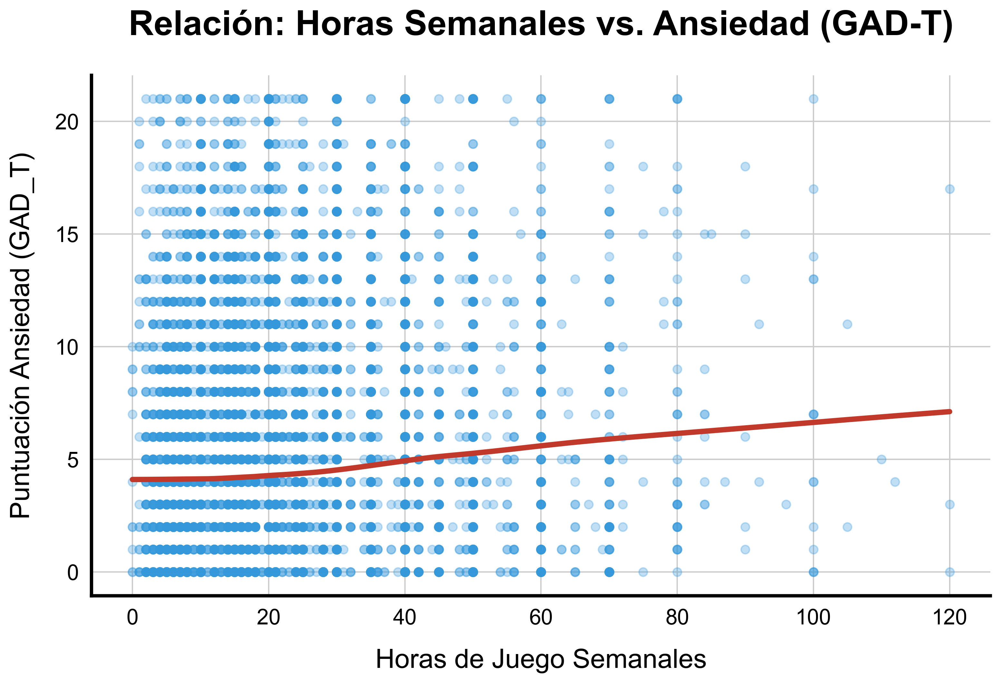

In [101]:


# 1. Configuración de figura transparente y tamaño XL
fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)

# 2. Dibujar el Scatter Plot con Lowess (Línea de tendencia flexible)
sns.regplot(
    data=df, 
    x="Hours_weekly", 
    y="GAD_T", 
    lowess=True, 
    scatter_kws={'alpha':0.3, 'color':'#3498db', 's': 40}, # Puntos azul oscuro
    line_kws={'color':'#c0392b', 'linewidth':4},        # Línea roja de tendencia
    ax=ax
)

# --- ESTÉTICA NEGRA "XL" ---

# Título y etiquetas coherentes con el resto de la tesis
plt.title('Relación: Horas Semanales vs. Ansiedad (GAD-T)', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Horas de Juego Semanales', fontsize=20, color='black', labelpad=15)
plt.ylabel('Puntuación Ansiedad (GAD_T)', fontsize=20, color='black', labelpad=15)

# Ajuste de números en los ejes
ax.tick_params(axis='both', colors='black', labelsize=16)

# Limpieza de bordes y grosor de líneas
sns.despine()
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)

# 3. GUARDAR
plt.savefig('relacion_horas_ansiedad_canva.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

In [102]:

top_3_earnings = df['earnings'].value_counts().nlargest(3).index

df['earnings_clean'] = df['earnings'].where(df['earnings'].isin(top_3_earnings))


C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\3954989441.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




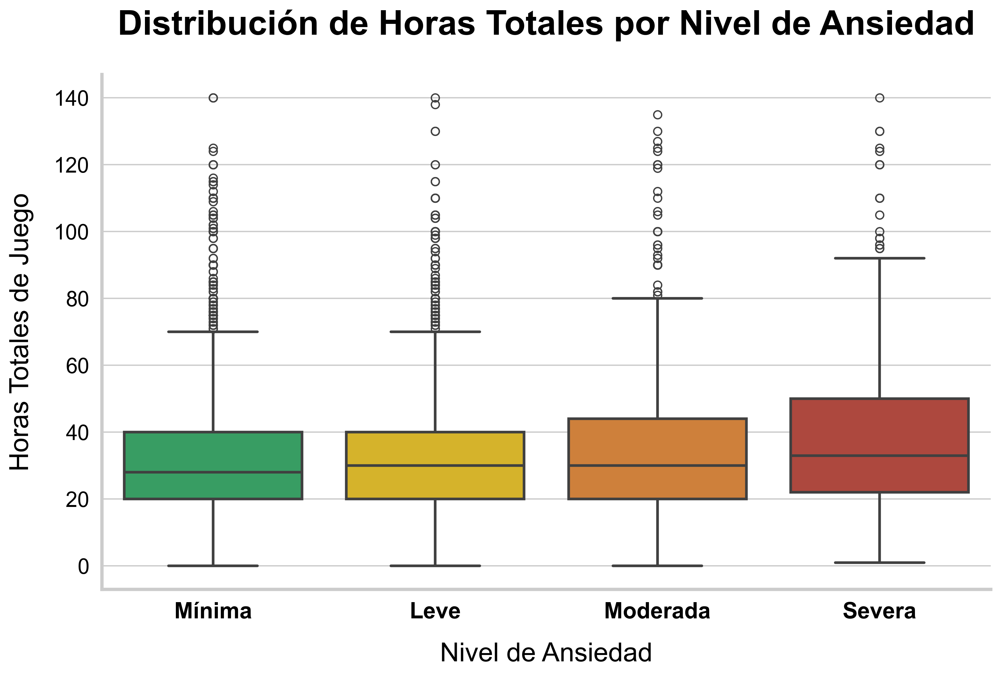

In [103]:

orden_ansiedad = ["Mínima", "Leve", "Moderada", "Severa"]
paleta_semaforo = ['#27ae60', '#f1c40f', '#e67e22', '#c0392b']


fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.boxplot(
    data=df, 
    x="Nivel_Ansiedad", 
    y="Horas_totales", 
    order=orden_ansiedad,
    palette=paleta_semaforo,
    linewidth=2,
    ax=ax
)


plt.title('Distribución de Horas Totales por Nivel de Ansiedad', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Nivel de Ansiedad', fontsize=20, color='black', labelpad=15)
plt.ylabel('Horas Totales de Juego', fontsize=20, color='black', labelpad=15)

plt.xticks(fontsize=17, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')

sns.despine()
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


plt.savefig('boxplot_horas_ansiedad_castellano.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\1265987774.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




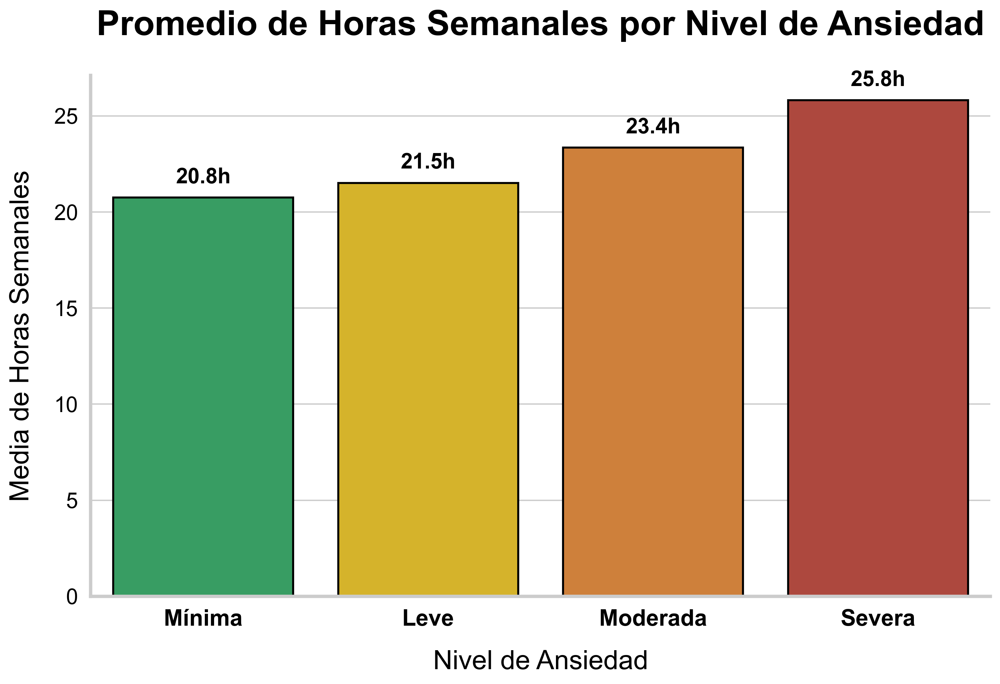

In [104]:

fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.barplot(
    data=df, 
    x="Nivel_Ansiedad", 
    y="Hours_weekly", 
    order=orden_ansiedad,
    palette=paleta_semaforo,
    estimator='mean', 
    errorbar=None,
    edgecolor='black',
    linewidth=1.5,
    ax=ax
)


plt.title('Promedio de Horas Semanales por Nivel de Ansiedad', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Nivel de Ansiedad', fontsize=20, color='black', labelpad=15)
plt.ylabel('Media de Horas Semanales', fontsize=20, color='black', labelpad=15)

plt.xticks(fontsize=17, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')


for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}h', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 15), 
                textcoords = 'offset points',
                fontsize=16, fontweight='bold', color='black')

sns.despine()
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


plt.savefig('barplot_horas_ansiedad_castellano.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

In [105]:

top_4_reasons = df['whyplay'].value_counts().nlargest(4).index



df['whyplay_Clean'] = df['whyplay'].where(df['whyplay'].isin(top_4_reasons))

In [106]:
df['whyplay_Clean'].value_counts()

whyplay_Clean
having fun    5279
improving     4910
winning       2080
relaxing       652
Name: count, dtype: int64

In [107]:

orden_rangos = ["Unranked", "Bronze", "Silver", "Gold", "Platinum", "Diamond", "Master", "Challenger"]


In [108]:
colores_lol = {
    'Unranked':'#aab7b8',
    'Bronze': '#8c513a',
    'Silver': '#80989d',
    'Gold': '#cd8837',
    'Platinum': '#4e9996',
    'Diamond': '#576ba6',
    'Master': '#9d50a0',
    'Challenger': '#f4c874'
}



C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\1189788084.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




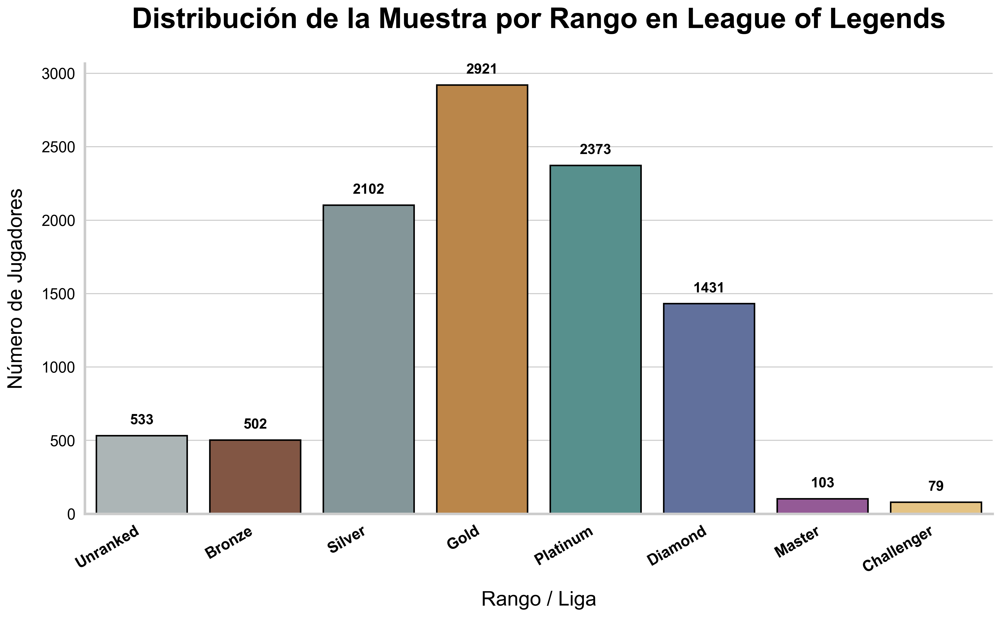

In [109]:

fig, ax = plt.subplots(figsize=(16, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.countplot(
    data=df, 
    x="LOL_Rank", 
    order=orden_rangos, 
    palette=colores_lol,
    edgecolor='black',
    linewidth=1.5,
    ax=ax
)


plt.title('Distribución de la Muestra por Rango en League of Legends', fontsize=28, pad=35, color='black', fontweight='bold')
plt.xlabel('Rango / Liga', fontsize=20, color='black', labelpad=15)
plt.ylabel('Número de Jugadores', fontsize=20, color='black', labelpad=15)

# Etiquetas de los ejes
plt.xticks(rotation=30, ha='right', fontsize=15, color='black', fontweight='bold')
plt.yticks(fontsize=15, color='black')


for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 15), 
                textcoords = 'offset points',
                fontsize=14, fontweight='bold', color='black')


sns.despine()
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


plt.savefig('distribucion_rangos_lol.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\3812275567.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




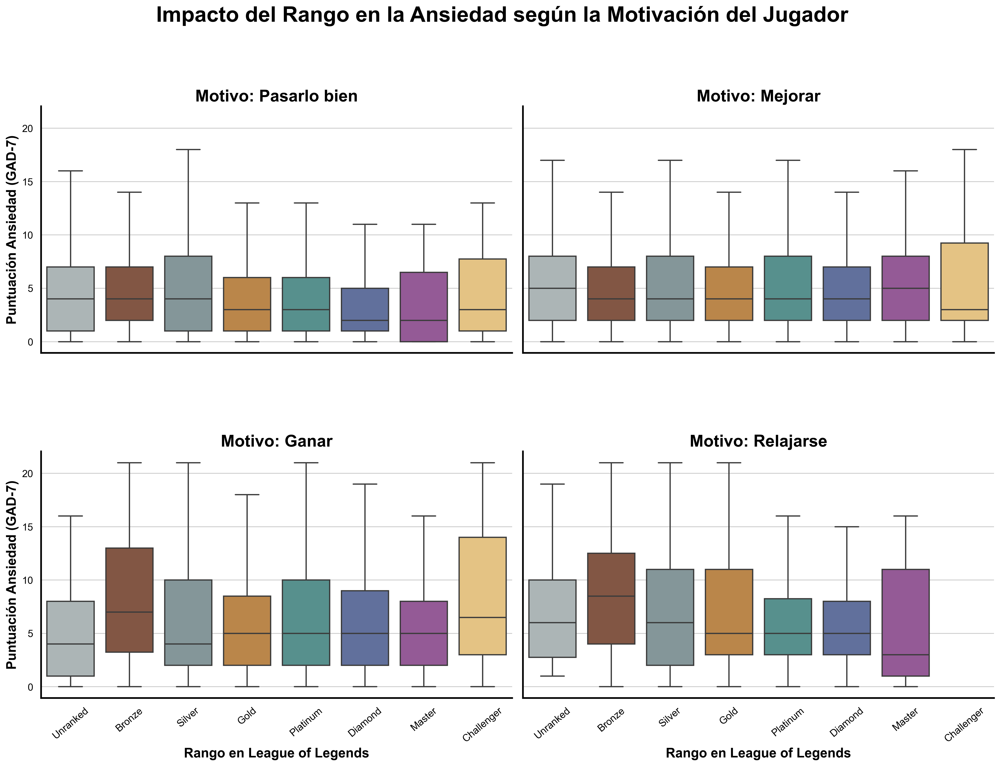

In [110]:




df_plot = df[df['LOL_Rank'].isin(orden_rangos) & df['whyplay_Clean'].notna()].copy()
df_plot['Motivo'] = df_plot['whyplay_Clean'].replace(mapeo_motivos)


g = sns.catplot(
    data=df_plot, 
    x="LOL_Rank", 
    y="GAD_T", 
    col="Motivo", 
    col_wrap=2,           
    kind="box", 
    order=orden_rangos,
    palette=colores_lol,  
    height=6, 
    aspect=1.4,
    showfliers=False,      
    linewidth=1.5
)

g.fig.patch.set_alpha(0) 

for ax in g.axes.flat:
    ax.patch.set_alpha(0) 
    
    #
    titulo_actual = ax.get_title().replace("Motivo = ", "")
    ax.set_title(f"Motivo: {titulo_actual}", fontsize=20, fontweight='bold', color='black')
    
  
    ax.set_xlabel("Rango en League of Legends", fontsize=16, color='black', fontweight='bold')
    ax.set_ylabel("Puntuación Ansiedad (GAD-7)", fontsize=16, color='black', fontweight='bold')
    
    
    ax.tick_params(axis='x', rotation=40, labelsize=12, labelcolor='black')
    ax.tick_params(axis='y', labelsize=12, labelcolor='black')
    
   
    sns.despine(ax=ax)
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(2)

plt.subplots_adjust(top=0.88, hspace=0.4) 
g.fig.suptitle('Impacto del Rango en la Ansiedad según la Motivación del Jugador', 
             fontsize=26, color='black', fontweight='bold', y=1.02)


plt.savefig('ansiedad_rango_motivacion_xl.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

In [111]:
rank_mapping = {
    "Unranked": 0,
    "Bronze": 1,
    "Silver": 2,
    "Gold": 3,
    "Platinum": 4,
    "Diamond": 5,
    "Master": 6,
    "Challenger": 7
}


df['Rank_Num'] = df['LOL_Rank'].map(rank_mapping)

In [112]:


df_filtrado = df[df['LOL_Rank'].isin(orden_rangos) & df['whyplay_Clean'].notna()]


heatmap_data = df_filtrado.pivot_table(
    index='whyplay_Clean', 
    columns='LOL_Rank', 
    values='GAD_T', 
    aggfunc='mean'
)


heatmap_data = heatmap_data[orden_rangos]

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\293309034.py:4: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



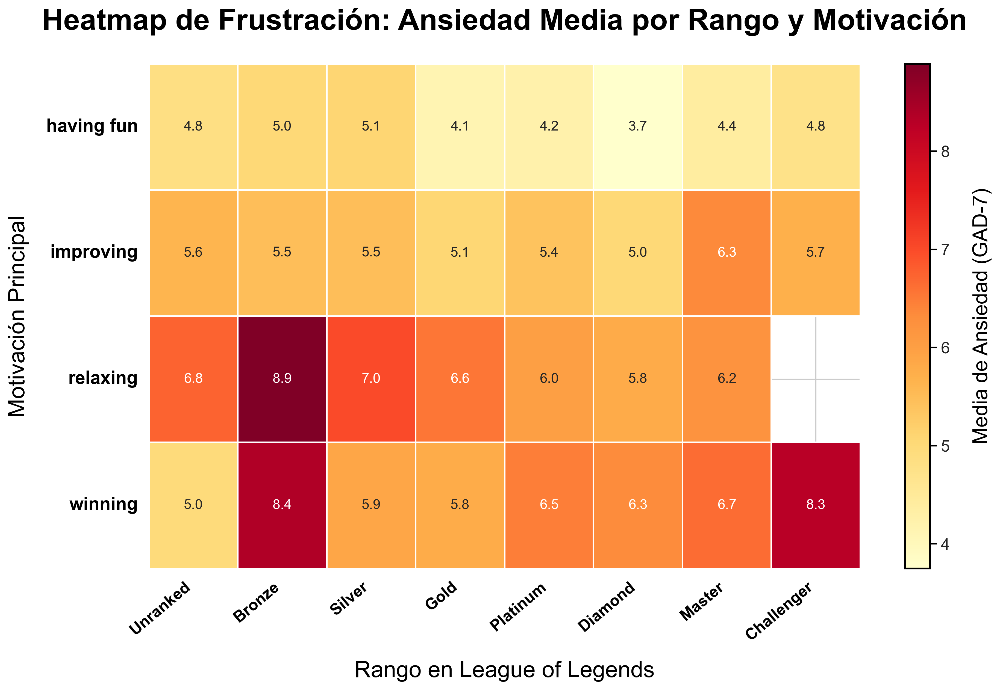

In [113]:






fig, ax = plt.subplots(figsize=(14, 8))
fig.patch.set_alpha(0) 
ax.patch.set_alpha(0)  

sns.heatmap(
    heatmap_data, 
    annot=True,           
    fmt=".1f",            
    cmap="YlOrRd",        
    linewidths=1,         
    linecolor='white',    
    cbar_kws={'label': 'Media de Ansiedad (GAD-T)'},
    ax=ax
)


plt.title('Heatmap de Frustración: Ansiedad Media por Rango y Motivación', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Rango en League of Legends', fontsize=20, color='black', labelpad=15)
plt.ylabel('Motivación Principal', fontsize=20, color='black', labelpad=15)


plt.xticks(rotation=40, ha='right', fontsize=14, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black', fontweight='bold', rotation=0)


cbar = ax.collections[0].colorbar
cbar.set_label('Media de Ansiedad (GAD-7)', fontsize=18, color='black', labelpad=20)
cbar.ax.tick_params(labelsize=14, color='black')
cbar.outline.set_edgecolor('black')
cbar.outline.set_linewidth(1.5)


plt.savefig('heatmap_ansiedad_rango_motivacion_xl.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\1284759365.py:6: UserWarning:



The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).




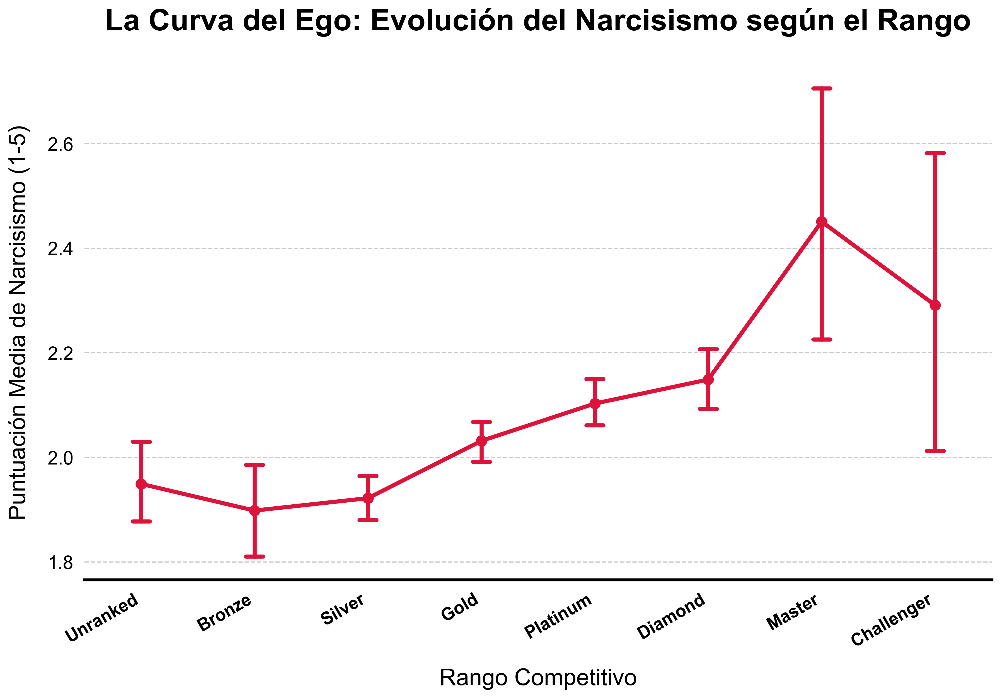

In [114]:

fig, ax = plt.subplots(figsize=(14, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.pointplot(
    data=df, 
    x="LOL_Rank", 
    y="Narcissism", 
    order=orden_rangos,   
    color="#dc143c",     
    capsize=0.15,         
    markers="o",
    linestyles="-",
    errorbar=('ci', 95),  
    scale=1.3,            
    ax=ax
)



plt.title('La Curva del Ego: Evolución del Narcisismo según el Rango', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Rango Competitivo', fontsize=20, color='black', labelpad=15)
plt.ylabel('Puntuación Media de Narcisismo (1-5)', fontsize=20, color='black', labelpad=15)


plt.xticks(rotation=30, ha='right', fontsize=15, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')


ax.yaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.4)
ax.xaxis.grid(False)

sns.despine(left=True) 
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['bottom'].set_color('black')


plt.savefig('curva_ego_narcisismo_xl.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\2038840928.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




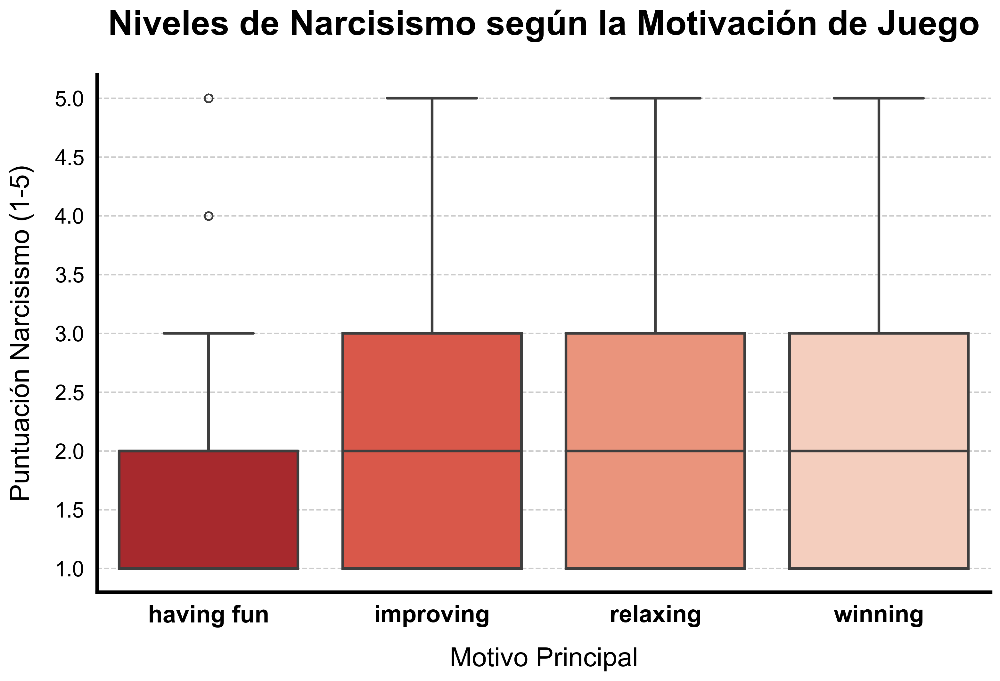

In [115]:



orden_ego = df.groupby('whyplay_Clean')['Narcissism'].median().sort_values(ascending=False).index


fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.boxplot(
    data=df, 
    x="whyplay_Clean", 
    y="Narcissism", 
    order=orden_ego,
    palette="Reds_r",  
    linewidth=2,       
    ax=ax
)



plt.title('Niveles de Narcisismo según la Motivación de Juego', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Motivo Principal', fontsize=20, color='black', labelpad=15)
plt.ylabel('Puntuación Narcisismo (1-5)', fontsize=20, color='black', labelpad=15)


plt.xticks(fontsize=18, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')


ax.yaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.4)
ax.xaxis.grid(False)


sns.despine()
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')


plt.savefig('narcisismo_motivacion_xl.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

In [116]:

stats = df[df['whyplay_Clean'] == 'having fun']['Narcissism'].describe(percentiles=[.25, .5, .75])
print("Estadísticas de 'Having Fun':")
print(stats[['25%', '50%', '75%']])

Estadísticas de 'Having Fun':
25%    1.0
50%    2.0
75%    2.0
Name: Narcissism, dtype: float64


satisfaccion

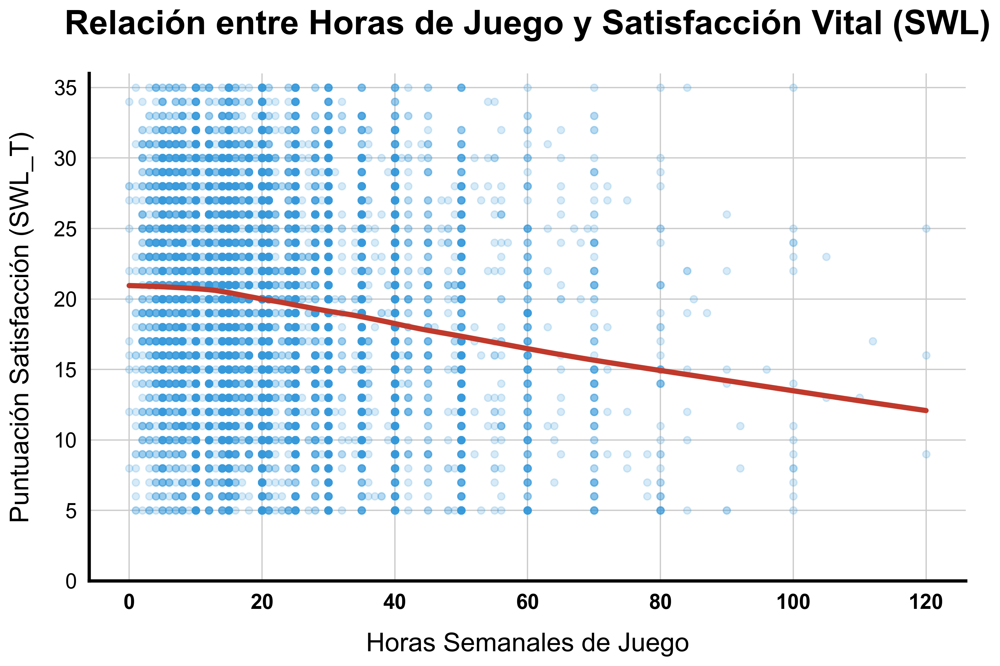

In [117]:



fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.regplot(
    data=df, 
    x="Hours_weekly", 
    y="SWL_T", 
    lowess=True,                 
    scatter_kws={'alpha':0.2, 'color':'#3498db', 's': 30},
    line_kws={'color':'#c0392b', 'linewidth':4},       
    ax=ax
)



plt.title('Relación entre Horas de Juego y Satisfacción Vital (SWL)', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Horas Semanales de Juego', fontsize=20, color='black', labelpad=15)
plt.ylabel('Puntuación Satisfacción (SWL_T)', fontsize=20, color='black', labelpad=15)


plt.ylim(0, 36) 
plt.xticks(fontsize=16, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')


sns.despine()
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')


plt.savefig('relacion_horas_swl_xl.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\2834540940.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\2834540940.py:9: FutureWarning:



The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.5}` instead.




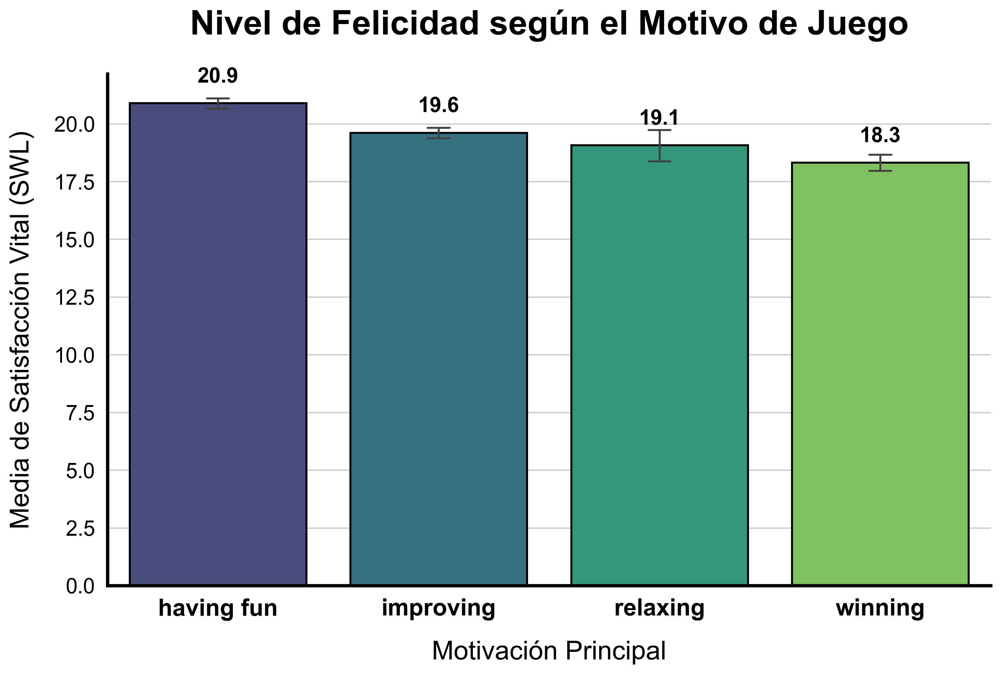

In [118]:

orden_felicidad = df_plot.groupby('whyplay_Clean')['SWL_T'].mean().sort_values(ascending=False).index


fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.barplot(
    data=df_plot, 
    x="whyplay_Clean", 
    y="SWL_T", 
    order=orden_felicidad, 
    palette="viridis",
    capsize=.1,            
    errwidth=1.5,          
    edgecolor='black',    
    linewidth=1.5,
    ax=ax
)



plt.title('Nivel de Felicidad según el Motivo de Juego', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Motivación Principal', fontsize=20, color='black', labelpad=15)
plt.ylabel('Media de Satisfacción Vital (SWL)', fontsize=20, color='black', labelpad=15)


plt.xticks(fontsize=18, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')


for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 20), 
                textcoords = 'offset points',
                fontsize=16, fontweight='bold', color='black')


sns.despine()
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')


plt.savefig('felicidad_motivacion_xl.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\1198767190.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




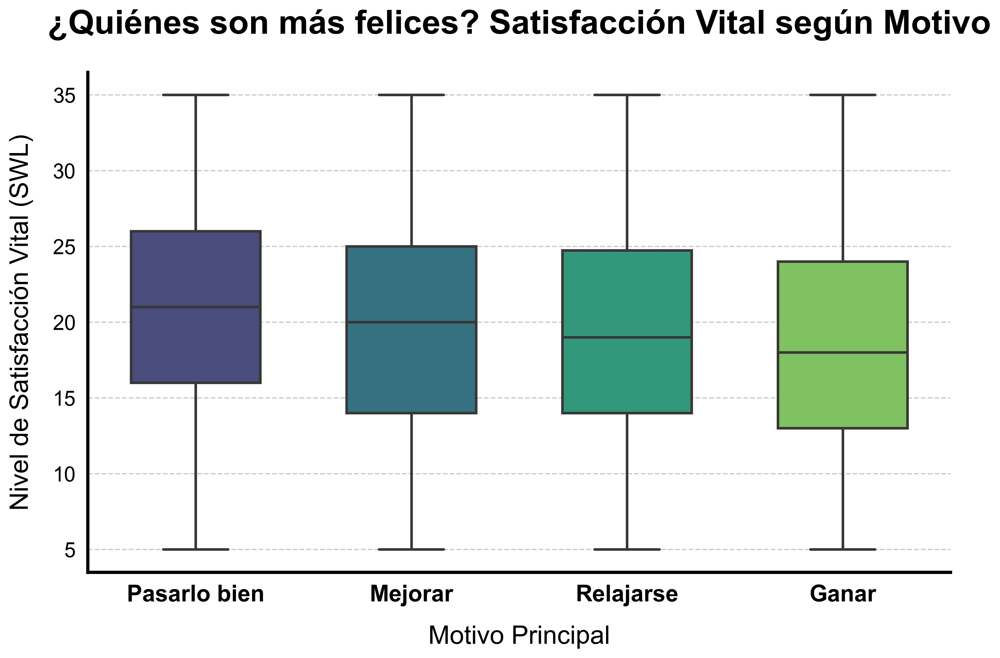

In [119]:



orden_felicidad = df_plot.groupby('Motivo')['SWL_T'].median().sort_values(ascending=False).index

fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)

sns.boxplot(
    data=df_plot,
    x="Motivo",
    y="SWL_T",
    order=orden_felicidad,
    palette="viridis",
    linewidth=2,       
    width=0.6,         
    ax=ax
)



plt.title('¿Quiénes son más felices? Satisfacción Vital según Motivo', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Motivo Principal', fontsize=20, color='black', labelpad=15)
plt.ylabel('Nivel de Satisfacción Vital (SWL)', fontsize=20, color='black', labelpad=15)


plt.xticks(fontsize=18, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')


ax.yaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.4)
ax.xaxis.grid(False)


sns.despine()
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')


plt.savefig('felicidad_motivacion_boxplot_xl.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\1125212378.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




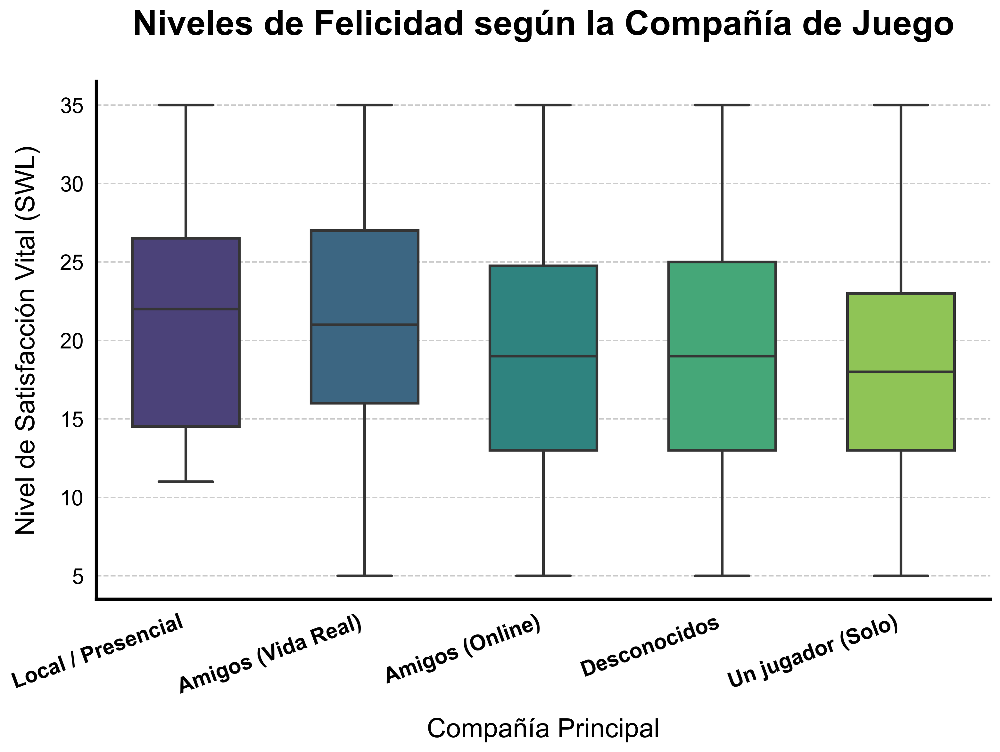

In [120]:



orden_felicidad2 = df_plot.groupby('Playstyle_Short')['SWL_T'].median().sort_values(ascending=False).index


fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.boxplot(
    data=df_plot,
    x="Playstyle_Short",
    y="SWL_T",
    order=orden_felicidad2,
    palette="viridis", 
    linewidth=2,
    width=0.6,
    ax=ax
)



plt.title('Niveles de Felicidad según la Compañía de Juego', fontsize=26, pad=35, color='black', fontweight='bold')
plt.xlabel('Compañía Principal', fontsize=20, color='black', labelpad=15)
plt.ylabel('Nivel de Satisfacción Vital (SWL)', fontsize=20, color='black', labelpad=15)


plt.xticks(rotation=20, ha='right', fontsize=16, color='black', fontweight='bold')
plt.yticks(fontsize=16, color='black')


ax.yaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.4)
ax.xaxis.grid(False)


sns.despine()
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')

# 5. GUARDAR
plt.savefig('felicidad_playstyle_xl.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

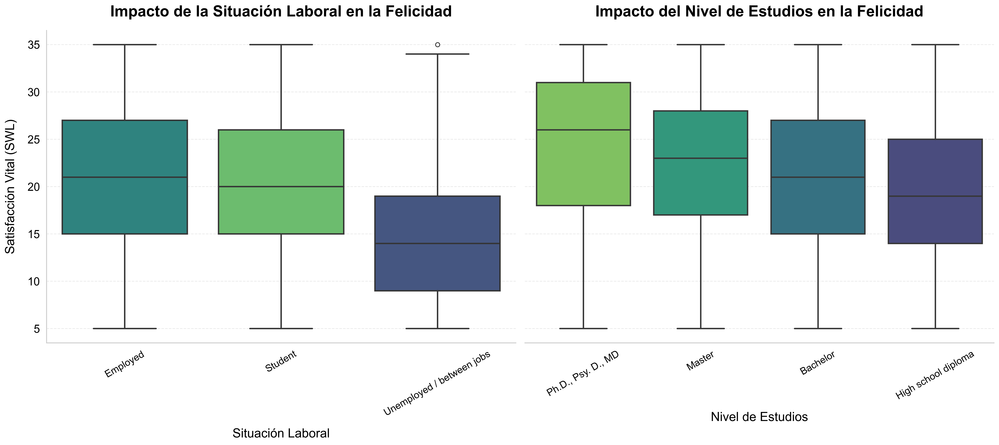

In [121]:



df_work_clean = df[df['Work'].notna() & (df['Work'] != 'Sin contestar')].copy()
df_degree_clean = df[df['Degree'].notna() & (df['Degree'] != 'Sin contestar')].copy()


order_work = df_work_clean.groupby('Work', observed=True)['SWL_T'].median().sort_values(ascending=False).index
order_degree = df_degree_clean.groupby('Degree', observed=True)['SWL_T'].median().sort_values(ascending=False).index


fig, axes = plt.subplots(1, 2, figsize=(20, 9), sharey=True)
fig.patch.set_alpha(0) 


axes[0].patch.set_alpha(0)
sns.boxplot(
    data=df_work_clean,
    x='Work',
    y='SWL_T',
    hue='Work',       
    legend=False,     
    order=order_work,
    palette="viridis",
    linewidth=2,
    ax=axes[0]
)
axes[0].set_title('Impacto de la Situación Laboral en la Felicidad', fontsize=22, pad=20, color='black', fontweight='bold')
axes[0].set_xlabel('Situación Laboral', fontsize=18, color='black', labelpad=15)
axes[0].set_ylabel('Satisfacción Vital (SWL)', fontsize=18, color='black', labelpad=15)
axes[0].tick_params(axis='x', rotation=30, labelsize=14, labelcolor='black')
axes[0].tick_params(axis='y', labelsize=16, labelcolor='black')
axes[0].yaxis.grid(True, linestyle='--', alpha=0.4)
sns.despine(ax=axes[0])


axes[1].patch.set_alpha(0)
sns.boxplot(
    data=df_degree_clean,
    x='Degree',
    y='SWL_T',
    hue='Degree',    
    legend=False,     
    order=order_degree,
    palette="viridis",
    linewidth=2,
    ax=axes[1]
)
axes[1].set_title('Impacto del Nivel de Estudios en la Felicidad', fontsize=22, pad=20, color='black', fontweight='bold')
axes[1].set_xlabel('Nivel de Estudios', fontsize=18, color='black', labelpad=15)
axes[1].set_ylabel('', fontsize=0)
axes[1].tick_params(axis='x', rotation=30, labelsize=14, labelcolor='black')
axes[1].yaxis.grid(True, linestyle='--', alpha=0.4)
axes[1].tick_params(axis='y', left=False)
sns.despine(ax=axes[1], left=True)

plt.tight_layout()
plt.show()

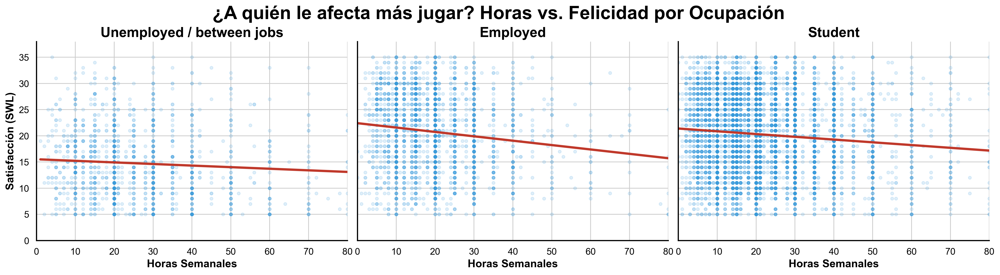

In [122]:
df_limpio_work = df[df['Work'].notna() & (df['Work'] != 'Sin contestar')].copy()

g = sns.lmplot(
    data=df_limpio_work,
    x="Hours_weekly",
    y="SWL_T",
    col="Work",          
    col_wrap=3,         
    height=5,            
    aspect=1.2,           
    scatter_kws={'alpha': 0.15, 's': 15, 'color': '#3498db'}, 
    line_kws={'color': '#c0392b', 'linewidth': 3},          
    ci=None              
)


g.fig.patch.set_alpha(0) 

for ax in g.axes.flat:
    ax.patch.set_alpha(0) 
    
  
    titulo_actual = ax.get_title().replace("Work = ", "")
    ax.set_title(titulo_actual, fontsize=18, fontweight='bold', color='black')
    
   
    ax.set_xlabel('Horas Semanales', fontsize=14, color='black', fontweight='bold')
    ax.set_ylabel('Satisfacción (SWL)', fontsize=14, color='black', fontweight='bold')
    
    
    ax.set_ylim(0, 38)
    ax.set_xlim(0, 80) 
    
    
    ax.tick_params(axis='both', colors='black', labelsize=12)
    
    
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(1.5)


plt.subplots_adjust(top=0.85, hspace=0.4)
g.fig.suptitle('¿A quién le afecta más jugar? Horas vs. Felicidad por Ocupación', 
             fontsize=24, color='black', fontweight='bold', y=0.98)


plt.savefig('horas_felicidad_ocupacion_xl.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

clustering

In [123]:
df["earnings_clean"].value_counts()

earnings_clean
I play for fun                                                                               12079
I play mostly for fun but earn a little on the side (tournament winnings, streaming, etc)      985
I earn a living by playing this game                                                            45
Name: count, dtype: int64

In [124]:
traduccion_earnings={
    'I play for fun': 0 ,
    'I play mostly for fun but earn a little on the side (tournament winnings, streaming, etc)':1,
    'I earn a living by playing this game':2
}

traduccion_estudios={
    'High school diploma':0,
    'Bachelor':1,
    'Master':2,
    'Ph.D., Psy. D., MD':3
}
traduccion_trabajo={
    'Unemployed / between jobs':0,
    'Student':1,
    'Employed':1,
}
traduccion_playstyle={
    'Singleplayer':0,
    'Multiplayer - online - with strangers':1,
    'Multiplayer - online - with online acquaintances or teammates':2,
    'Multiplayer - online - with real life friends':3,
    'Multiplayer - offline (people in the same room) ':4
}


In [125]:
df["earnings_num"]=df["earnings_clean"].map(traduccion_earnings)
df["estudios_num"]=df["Degree"].map(traduccion_estudios)
df["work_num"]=df["Work"].map(traduccion_trabajo)
df["playstyle_num"]=df["Playstyle"].map(traduccion_playstyle)

In [126]:
df["work_num"].value_counts()

work_num
1.0    12001
0.0     1380
Name: count, dtype: int64

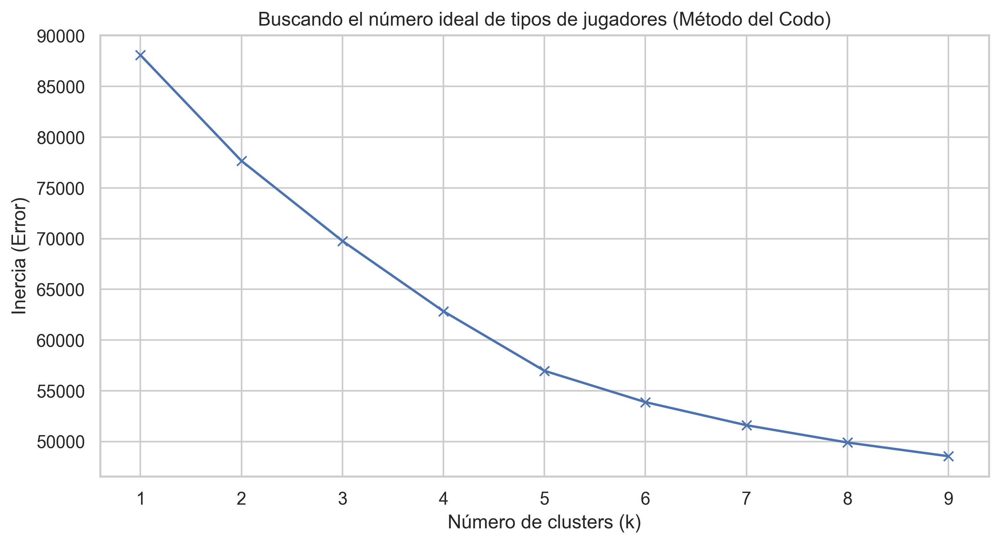

In [127]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


features_clustering = ['GAD_T', 'SPIN_T', 'SWL_T', 'Narcissism', 'Hours_weekly','Rank_Num','Age','work_num','earnings_num','estudios_num','playstyle_num']


df_cluster = df[features_clustering].dropna()


scaler = StandardScaler()
x_scaled = scaler.fit_transform(df_cluster)


distortions = []
K = range(1, 10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeanModel.fit(x_scaled)
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(10, 5))
plt.plot(K, distortions, 'bx-')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia (Error)')
plt.title('Buscando el número ideal de tipos de jugadores (Método del Codo)')
plt.show()

In [128]:

n_clusters =6
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
df_cluster['Cluster'] = kmeans.fit_predict(x_scaled)
nombres_finales = {
    0: 'Jugador Social Pleno',      # Alta Sociabilidad + Alta Felicidad
    1: 'Riesgo Clínico',            # Alta Ansiedad/Fobia + Baja Felicidad
    2: 'Desocupados/En Transición', # Baja Actividad Laboral
    3: 'Veteranos Adaptados',       # Alta Edad + Estudios + Salud Mental
    4: 'Élite Competitiva',         # Altos Ingresos + Rango + Horas
    5: 'Solitario Independiente'    # Baja Sociabilidad + Baja Ansiedad (No es fobia, es elección)
}

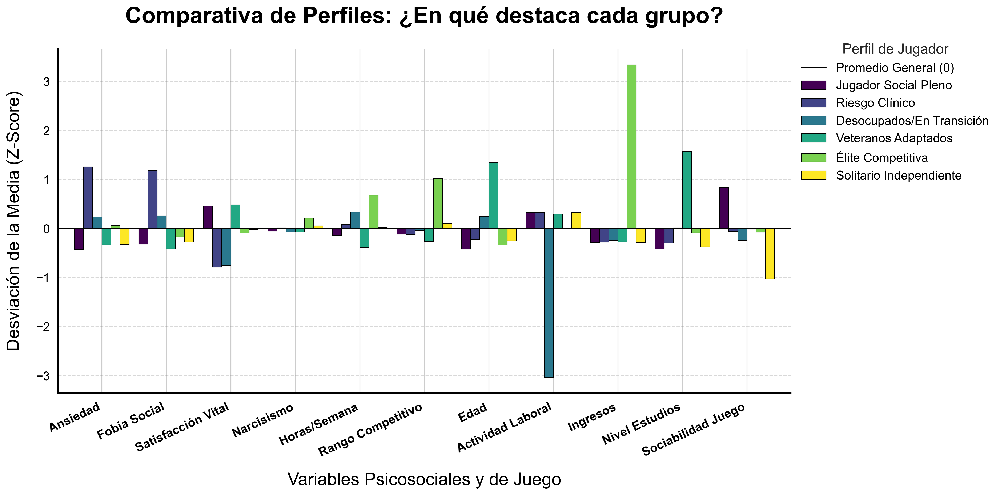

In [129]:



resumen_clusters = pd.DataFrame(x_scaled, columns=features_clustering)
resumen_clusters['Cluster'] = df_cluster['Cluster'].values


resumen_visual = resumen_clusters.groupby('Cluster').mean().T



resumen_visual.columns = [nombres_finales.get(c, c) for c in resumen_visual.columns]

traduccion_vars = {
    'GAD_T': 'Ansiedad',
    'SPIN_T': 'Fobia Social',
    'SWL_T': 'Satisfacción Vital',
    'Narcissism': 'Narcisismo',
    'Hours_weekly': 'Horas/Semana',
    'Rank_Num': 'Rango Competitivo',
    'Age': 'Edad',
    'work_num': 'Actividad Laboral',
    'earnings_num': 'Ingresos',
    'estudios_num': 'Nivel Estudios',
    'playstyle_num': 'Sociabilidad Juego'
}
resumen_visual = resumen_visual.rename(index=traduccion_vars)


fig, ax = plt.subplots(figsize=(16, 8))
fig.patch.set_alpha(0) 
ax.patch.set_alpha(0)


resumen_visual.plot(
    kind='bar', 
    width=0.85, 
    colormap='viridis', 
    edgecolor='black',  
    linewidth=0.5,
    ax=ax
)


plt.title('Comparativa de Perfiles: ¿En qué destaca cada grupo?', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Variables Psicosociales y de Juego', fontsize=20, color='black', labelpad=15)
plt.ylabel('Desviación de la Media (Z-Score)', fontsize=20, color='black', labelpad=15)


plt.axhline(0, color='black', linewidth=1, linestyle='-', label='Promedio General (0)')


plt.xticks(rotation=25, ha='right', fontsize=14, color='black', fontweight='bold')
plt.yticks(fontsize=14, color='black')
ax.yaxis.grid(True, linestyle='--', alpha=0.3, color='grey') 


plt.legend(
    bbox_to_anchor=(1.0, 1.05), 
    loc='upper left', 
    fontsize=14, 
    title='Perfil de Jugador',
    title_fontsize=16,
    frameon=False,
    labelcolor='black'
)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')


plt.tight_layout()
plt.savefig('barras_perfiles_clusters_xl.png', transparent=True, dpi=300)
plt.show()

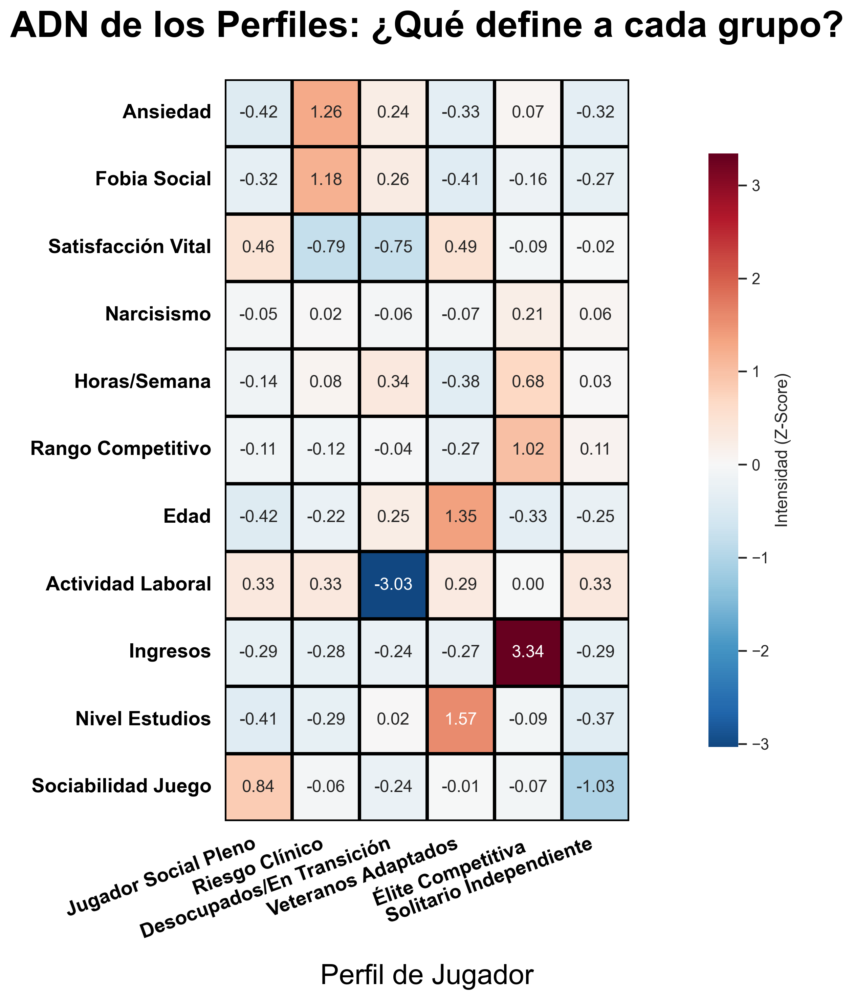

In [130]:


resumen_clusters = pd.DataFrame(x_scaled, columns=features_clustering)
resumen_clusters['Cluster'] = df_cluster['Cluster'].values


heatmap_data = resumen_clusters.groupby('Cluster').mean().T


heatmap_data.columns = [nombres_finales.get(i, i) for i in heatmap_data.columns]


traduccion_vars = {
    'GAD_T': 'Ansiedad',
    'SPIN_T': 'Fobia Social',
    'SWL_T': 'Satisfacción Vital',
    'Narcissism': 'Narcisismo',
    'Hours_weekly': 'Horas/Semana',
    'Rank_Num': 'Rango Competitivo',
    'Age': 'Edad',
    'work_num': 'Actividad Laboral',
    'earnings_num': 'Ingresos',
    'estudios_num': 'Nivel Estudios',
    'playstyle_num': 'Sociabilidad Juego'
}
heatmap_data = heatmap_data.rename(index=traduccion_vars)


plt.figure(figsize=(16, 10))
plt.gcf().patch.set_alpha(0)

sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",  
    center=0,       
    annot=True,     
    fmt=".2f",
    linewidths=2,
    linecolor='black',
    square=True,
    cbar_kws={'label': 'Intensidad (Z-Score)', 'shrink': 0.8}
)


plt.title('ADN de los Perfiles: ¿Qué define a cada grupo?', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Perfil de Jugador', fontsize=20, color='black', labelpad=15)
plt.yticks(rotation=0, fontsize=14, fontweight='bold', color='black')
plt.xticks(rotation=20, ha='right', fontsize=14, fontweight='bold', color='black')


plt.tight_layout()
plt.savefig('heatmap_adn_clusters_xl.png', transparent=True, dpi=300)
plt.show()

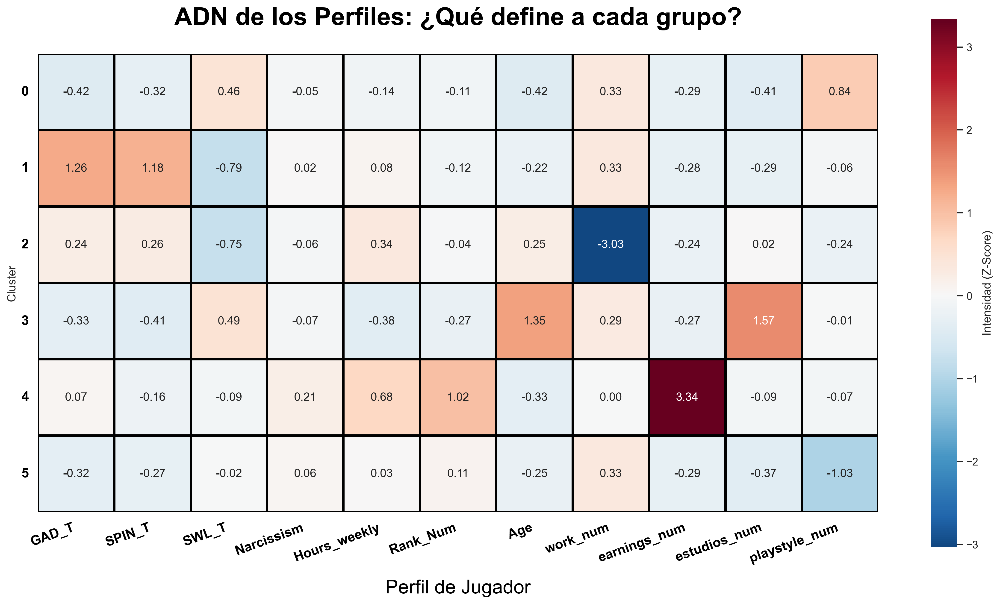

In [141]:
resumen_clusters = pd.DataFrame(x_scaled, columns=features_clustering)
resumen_clusters['Cluster'] = df_cluster['Cluster'].values


heatmap_data = resumen_clusters.groupby('Cluster').mean()


heatmap_data.columns = [nombres_finales.get(i, i) for i in heatmap_data.columns]


traduccion_vars = {
    'GAD_T': 'Ansiedad',
    'SPIN_T': 'Fobia Social',
    'SWL_T': 'Satisfacción Vital',
    'Narcissism': 'Narcisismo',
    'Hours_weekly': 'Horas/Semana',
    'Rank_Num': 'Rango Competitivo',
    'Age': 'Edad',
    'work_num': 'Actividad Laboral',
    'earnings_num': 'Ingresos',
    'estudios_num': 'Nivel Estudios',
    'playstyle_num': 'Sociabilidad Juego'
}
heatmap_data = heatmap_data.rename(index=traduccion_vars)


plt.figure(figsize=(16, 10))
plt.gcf().patch.set_alpha(0)

sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",  
    center=0,       
    annot=True,     
    fmt=".2f",
    linewidths=2,
    linecolor='black',
    square=True,
    cbar_kws={'label': 'Intensidad (Z-Score)', 'shrink': 0.8}
)


plt.title('ADN de los Perfiles: ¿Qué define a cada grupo?', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Perfil de Jugador', fontsize=20, color='black', labelpad=15)
plt.yticks(rotation=0, fontsize=14, fontweight='bold', color='black')
plt.xticks(rotation=20, ha='right', fontsize=14, fontweight='bold', color='black')


plt.tight_layout()
plt.savefig('heatmap_adn_clusters_xl_H.png', transparent=True, dpi=300)
plt.show()

In [132]:
df_final = df_cluster.join(df[['Work', 'Degree', 'whyplay_Clean', 'LOL_Rank','Playstyle_Clean','whyplay_Clean','Gender']])

C:\Users\ismae\AppData\Local\Temp\ipykernel_37384\1779171314.py:19: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




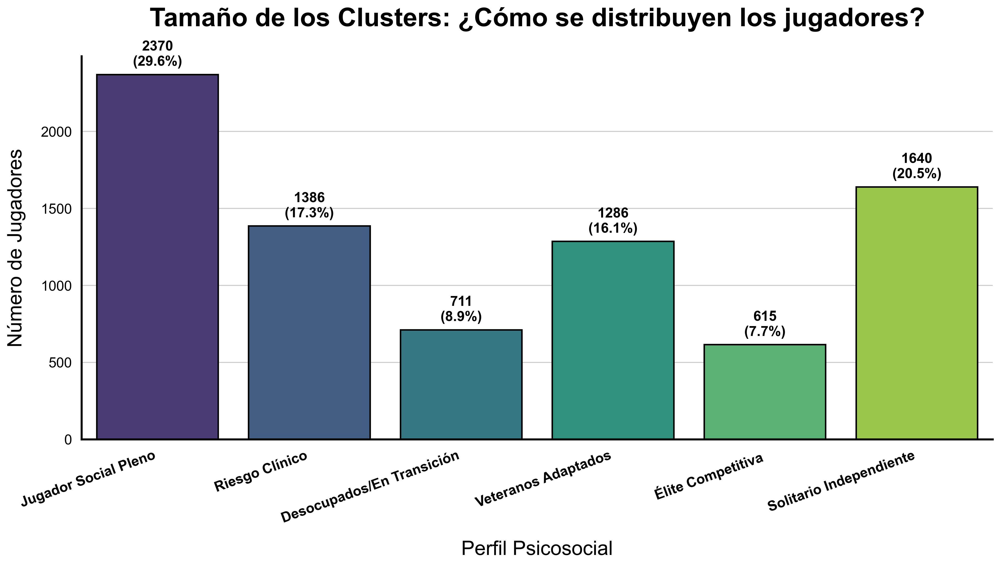

In [133]:

if 'Cluster_Label' not in df_final.columns:
    
    df_final['Nombre_Perfil'] = df_final['Cluster'].map(nombres_finales)
else:
    df_final['Nombre_Perfil'] = df_final['Cluster_Label'].map(nombres_finales)


total = len(df_final)


orden_visual = [nombres_finales[i] for i in range(6)]


fig, ax = plt.subplots(figsize=(14, 8))
fig.patch.set_alpha(0) 
ax.patch.set_alpha(0)


sns.countplot(
    data=df_final, 
    x='Nombre_Perfil', 
    order=orden_visual, 
    palette='viridis',  
    edgecolor='black',
    linewidth=1.5,
    ax=ax
)


for p in ax.patches:
    height = p.get_height()
    percentage = '{:.1f}%'.format(100 * height/total)
    ax.annotate(f'{int(height)}\n({percentage})', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='center', 
                xytext=(0, 20), 
                textcoords='offset points',
                fontsize=14, fontweight='bold', color='black')


plt.title('Tamaño de los Clusters: ¿Cómo se distribuyen los jugadores?', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Perfil Psicosocial', fontsize=20, color='black', labelpad=15)
plt.ylabel('Número de Jugadores', fontsize=20, color='black', labelpad=15)


plt.xticks(rotation=20, ha='right', fontsize=14, fontweight='bold', color='black')
plt.yticks(fontsize=14, color='black')


sns.despine()
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')


plt.tight_layout()
plt.savefig('distribucion_clusters_xl.png', transparent=True, dpi=300)
plt.show()

In [134]:

df_final = df_cluster.join(df[['Work', 'Degree', 'whyplay_Clean', 'LOL_Rank','Playstyle_Clean','whyplay_Clean','Gender']])

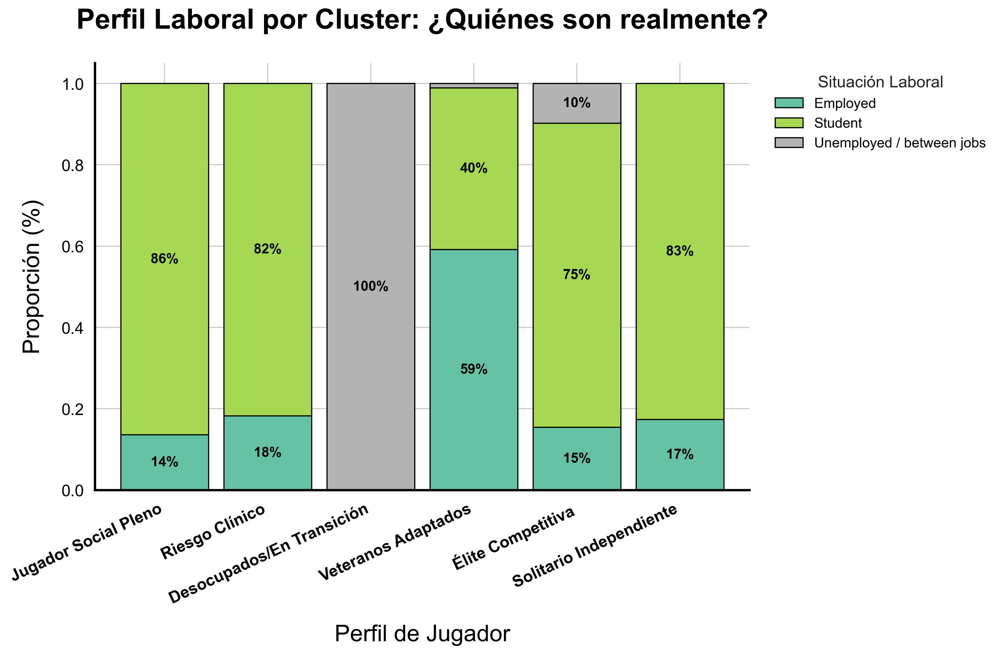

In [135]:



if 'Nombre_Perfil' not in df_final.columns:
    df_final['Nombre_Perfil'] = df_final['Cluster'].map(nombres_finales)


trabajo_por_cluster = pd.crosstab(df_final['Nombre_Perfil'], df_final['Work'], normalize='index')


orden_filas = [nombres_finales[i] for i in range(6) if nombres_finales[i] in trabajo_por_cluster.index]
trabajo_por_cluster = trabajo_por_cluster.reindex(orden_filas)


fig, ax = plt.subplots(figsize=(12, 8))
fig.patch.set_alpha(0) 
ax.patch.set_alpha(0)



trabajo_por_cluster.plot(
    kind='bar', 
    stacked=True, 
    width=0.85, 
    colormap='Set2', 
    edgecolor='black',
    linewidth=1,
    ax=ax
)

for c in ax.containers:
    
    labels = [f'{v.get_height():.0%}' if v.get_height() > 0.05 else '' for v in c]
    ax.bar_label(c, labels=labels, label_type='center', fontsize=12, fontweight='bold', color='black')


plt.title('Perfil Laboral por Cluster: ¿Quiénes son realmente?', fontsize=24, pad=30, color='black', fontweight='bold')
plt.xlabel('Perfil de Jugador', fontsize=20, color='black', labelpad=15)
plt.ylabel('Proporción (%)', fontsize=20, color='black', labelpad=15)


plt.xticks(rotation=25, ha='right', fontsize=14, color='black', fontweight='bold')
plt.yticks(fontsize=14, color='black')


plt.legend(
    title='Situación Laboral', 
    bbox_to_anchor=(1.02, 1), 
    loc='upper left', 
    fontsize=12, 
    title_fontsize=14,
    frameon=False,
    labelcolor='black'
)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')


plt.tight_layout()
plt.savefig('composicion_laboral_clusters_xl.png', transparent=True, dpi=300)
plt.show()

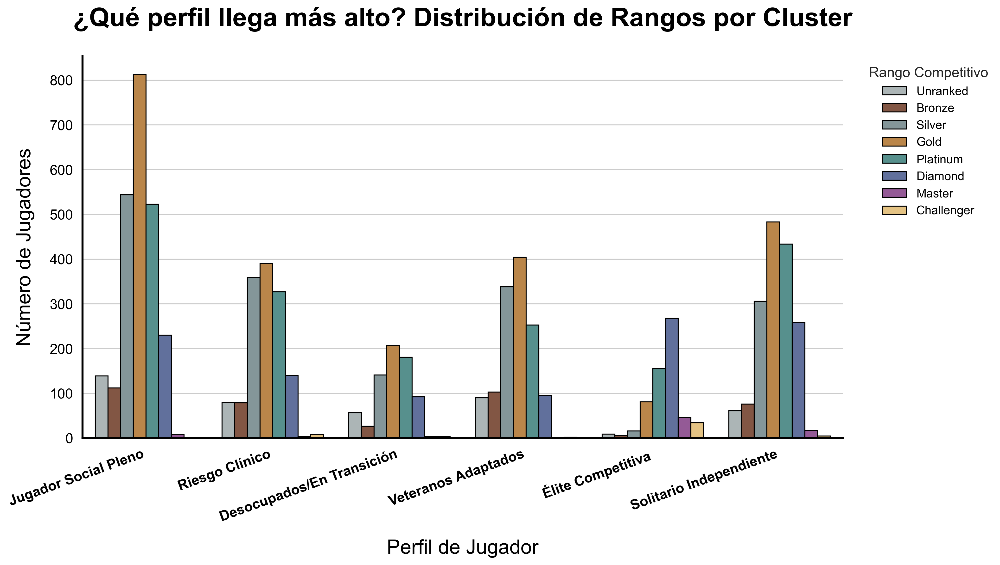

In [136]:


if 'Nombre_Perfil' not in df_final.columns:
    df_final['Nombre_Perfil'] = df_final['Cluster'].map(nombres_finales)

orden_perfiles = [nombres_finales[i] for i in range(6)]


orden_rangos = ["Unranked",  "Bronze", "Silver", "Gold", 
                "Platinum", "Diamond", "Master", 
                "Challenger"] 



fig, ax = plt.subplots(figsize=(14, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


sns.countplot(
    data=df_final, 
    x='Nombre_Perfil', 
    order=orden_perfiles,
    hue='LOL_Rank', 
    hue_order=orden_rangos,
    palette=colores_lol,
    edgecolor='black',
    linewidth=1,
    ax=ax
)


plt.title('¿Qué perfil llega más alto? Distribución de Rangos por Cluster', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Perfil de Jugador', fontsize=20, color='black', labelpad=15)
plt.ylabel('Número de Jugadores', fontsize=20, color='black', labelpad=15)


plt.xticks(rotation=20, ha='right', fontsize=14, color='black', fontweight='bold')
plt.yticks(fontsize=14, color='black')


plt.legend(
    title='Rango Competitivo', 
    bbox_to_anchor=(1.02, 1), 
    loc='upper left', 
    fontsize=12, 
    title_fontsize=14,
    frameon=False,
    labelcolor='black'
)


sns.despine()
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')


plt.tight_layout()
plt.savefig('rangos_por_cluster_xl.png', transparent=True, dpi=300)
plt.show()

In [137]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8008 entries, 11 to 13458
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   GAD_T            8008 non-null   int64   
 1   SPIN_T           8008 non-null   float64 
 2   SWL_T            8008 non-null   int64   
 3   Narcissism       8008 non-null   float64 
 4   Hours_weekly     8008 non-null   float64 
 5   Rank_Num         8008 non-null   category
 6   Age              8008 non-null   int64   
 7   work_num         8008 non-null   float64 
 8   earnings_num     8008 non-null   float64 
 9   estudios_num     8008 non-null   category
 10  playstyle_num    8008 non-null   float64 
 11  Cluster          8008 non-null   int32   
 12  Work             8008 non-null   object  
 13  Degree           8008 non-null   category
 14  whyplay_Clean    7770 non-null   object  
 15  LOL_Rank         8008 non-null   category
 16  Playstyle_Clean  8008 non-null   object  
 17

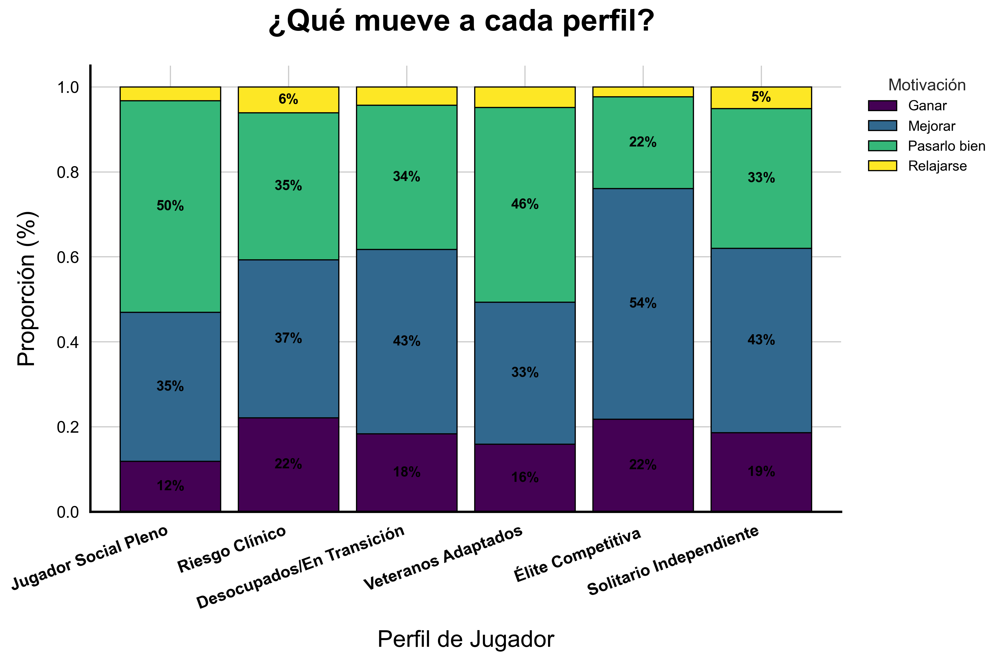

In [138]:

if 'Nombre_Perfil' not in df_final.columns:
    df_final['Nombre_Perfil'] = df_final['Cluster'].map(nombres_finales)

columnas = ['Nombre_Perfil', 'whyplay_Clean']
df_plot = df_final[columnas].dropna().copy()
df_plot = df_plot.loc[:, ~df_plot.columns.duplicated()]
df_plot = df_plot.explode('whyplay_Clean')


mapeo_motivos = {
    'having fun': 'Pasarlo bien',
    'improving': 'Mejorar',
    'relaxing': 'Relajarse',
    'winning': 'Ganar'
}
df_plot['Motivo'] = df_plot['whyplay_Clean'].replace(mapeo_motivos)


motivo_por_cluster = pd.crosstab(
    df_plot['Nombre_Perfil'],
    df_plot['Motivo'],
    normalize='index'
)


orden_filas = [nombres_finales[i] for i in range(6) if nombres_finales[i] in motivo_por_cluster.index]
motivo_por_cluster = motivo_por_cluster.reindex(orden_filas)


orden_motivos = ['Ganar', 'Mejorar', 'Pasarlo bien', 'Relajarse']
motivo_por_cluster = motivo_por_cluster[orden_motivos]


fig, ax = plt.subplots(figsize=(12, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


motivo_por_cluster.plot(
    kind='bar', 
    stacked=True, 
    width=0.85, 
    colormap='viridis',  
    edgecolor='black',
    linewidth=1,
    ax=ax
)


for c in ax.containers:
    labels = [f'{v.get_height():.0%}' if v.get_height() > 0.05 else '' for v in c]
    
   
    ax.bar_label(c, labels=labels, label_type='center', fontsize=12, fontweight='bold', color='black')

plt.title('¿Qué mueve a cada perfil? ', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Perfil de Jugador', fontsize=20, color='black', labelpad=15)
plt.ylabel('Proporción (%)', fontsize=20, color='black', labelpad=15)

plt.xticks(rotation=20, ha='right', fontsize=14, color='black', fontweight='bold')
plt.yticks(fontsize=14, color='black')

plt.legend(
    title='Motivación', 
    bbox_to_anchor=(1.02, 1), 
    loc='upper left', 
    fontsize=12, 
    title_fontsize=14,
    frameon=False,
    labelcolor='black'
)

sns.despine()
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')

plt.tight_layout()
plt.savefig('motivacion_clusters_viridis_xl.png', transparent=True, dpi=300)
plt.show()

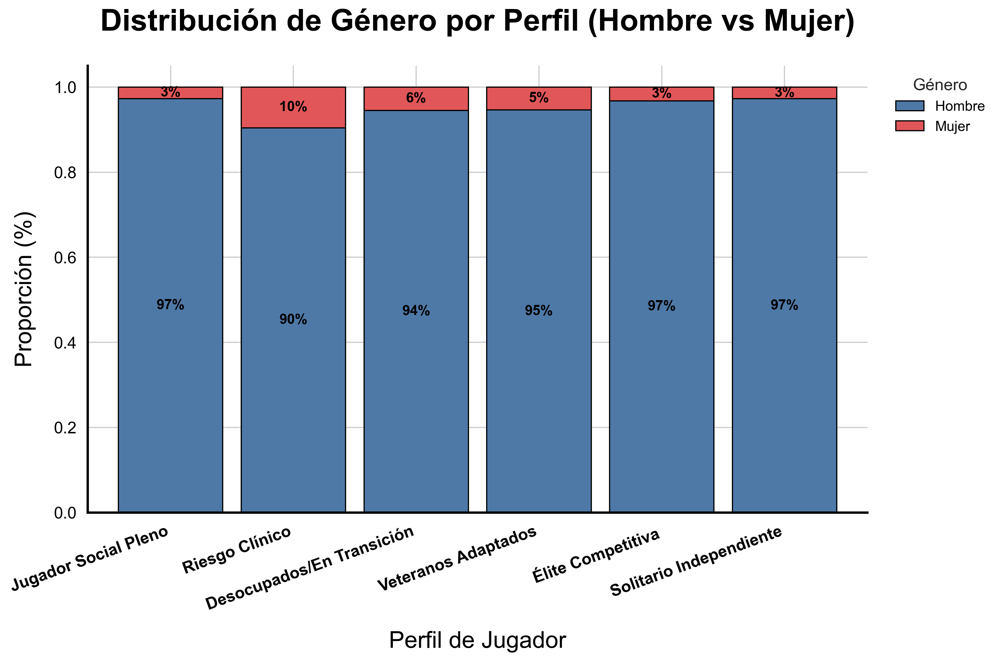

In [139]:

colores_genero = {
    'Hombre': '#4e79a7', 
    'Mujer': '#e15759'    
}

if 'Nombre_Perfil' not in df_final.columns:
    df_final['Nombre_Perfil'] = df_final['Cluster'].map(nombres_finales)

columnas = ['Nombre_Perfil', 'Gender']
df_plot = df_final[columnas].dropna().copy()


df_plot = df_plot[df_plot['Gender'].isin(['Male', 'Female'])]


mapeo_genero = {'Male': 'Hombre', 'Female': 'Mujer'}
df_plot['Genero'] = df_plot['Gender'].replace(mapeo_genero)


genero_por_cluster = pd.crosstab(
    df_plot['Nombre_Perfil'],
    df_plot['Genero'],
    normalize='index'
)


orden_filas = [nombres_finales[i] for i in range(6) if nombres_finales[i] in genero_por_cluster.index]
genero_por_cluster = genero_por_cluster.reindex(orden_filas)


orden_columnas = ['Hombre', 'Mujer']
genero_por_cluster = genero_por_cluster[orden_columnas]


fig, ax = plt.subplots(figsize=(12, 8))
fig.patch.set_alpha(0)
ax.patch.set_alpha(0)


genero_por_cluster.plot(
    kind='bar', 
    stacked=True, 
    width=0.85, 
    color=[colores_genero['Hombre'], colores_genero['Mujer']], 
    edgecolor='black',
    linewidth=1,
    ax=ax
)


for c in ax.containers:
    
    labels = [f'{v.get_height():.0%}' for v in c]
    ax.bar_label(c, labels=labels, label_type='center', fontsize=12, fontweight='bold', color='black') # Texto blanco resalta más sobre azul/rosa


plt.title('Distribución de Género por Perfil (Hombre vs Mujer)', fontsize=26, pad=30, color='black', fontweight='bold')
plt.xlabel('Perfil de Jugador', fontsize=20, color='black', labelpad=15)
plt.ylabel('Proporción (%)', fontsize=20, color='black', labelpad=15)

plt.xticks(rotation=20, ha='right', fontsize=14, color='black', fontweight='bold')
plt.yticks(fontsize=14, color='black')


plt.legend(
    title='Género', 
    bbox_to_anchor=(1.02, 1), 
    loc='upper left', 
    fontsize=12, 
    title_fontsize=14,
    frameon=False,
    labelcolor='black'
)


sns.despine()
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')

plt.tight_layout()
plt.savefig('genero_clusters_limpio_xl.png', transparent=True, dpi=300)
plt.show()

In [140]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13419 entries, 0 to 13463
Data columns (total 37 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   ID                  13419 non-null  int64   
 1   GAD_T               13419 non-null  int64   
 2   GADE                12773 non-null  category
 3   SWL_T               13419 non-null  int64   
 4   Game                13419 non-null  object  
 5   Platform            13419 non-null  object  
 6   Hours_weekly        13419 non-null  float64 
 7   earnings            13419 non-null  object  
 8   whyplay             13419 non-null  object  
 9   League              11571 non-null  object  
 10  streams             13419 non-null  float64 
 11  SPIN_T              12773 non-null  float64 
 12  Narcissism          13396 non-null  float64 
 13  Gender              13419 non-null  object  
 14  Age                 13419 non-null  int64   
 15  Work                13419 non-null  objec